# Move and change the name of the output summary files:

In [449]:
ls Real_cars_output

 Volume in drive D is Data
 Volume Serial Number is 9E59-720E

 Directory of D:\Work\Jupyter Notebooks\ipyparallel-notebooks\Real_cars_output

28/06/2017  10:29    <DIR>          .
28/06/2017  10:29    <DIR>          ..
28/06/2017  10:20    <DIR>          file0000
28/06/2017  10:20    <DIR>          file0001
28/06/2017  10:20    <DIR>          file0002
28/06/2017  10:20    <DIR>          file0003
28/06/2017  10:20    <DIR>          file0004
28/06/2017  10:20    <DIR>          file0005
28/06/2017  10:29    <DIR>          file0006
28/06/2017  10:20    <DIR>          file0007
28/06/2017  10:20    <DIR>          file0008
28/06/2017  10:20    <DIR>          file0009
28/06/2017  10:20    <DIR>          file0010
28/06/2017  10:20    <DIR>          file0011
28/06/2017  10:20    <DIR>          file0012
28/06/2017  10:20    <DIR>          file0013
28/06/2017  10:20    <DIR>          file0014
28/06/2017  10:20    <DIR>          file0015
28/06/2017  10:20    <DIR>          file0016
28/06/2017  10:

In [2]:
import os

For **avoiding name clashes** when running the simulations in Petten, we save each summary file in a different folder named `fileXXXX`, where `XXXX` references the index of the parameter combination defined in an Excel file. So after the simulation is completed, we need to put all the summary files together in one folder (which name ends with `post`), appending `fileXXXX` to the begining of each summary file.

In [453]:
folname = 'Real_cars_output'
newfol = folname + '_post'
if not os.path.isdir(newfol):
    os.mkdir(newfol)

for fold in os.listdir(folname):
    for file in os.listdir(folname + '/' + fold):
        os.rename(folname + '/' + fold + '/' + file, newfol + '/' + 'par' + fold[4:8] + '_' + file)

In [23]:
for fold in os.listdir('Real_cars_output/'):
    if int(fold[4:8]) == 370 or int(fold[4:8]) == 380 or int(fold[4:8]) == 381 or \
           int(fold[4:8]) == 383 or int(fold[4:8]) == 386 or int(fold[4:8]) == 388 or \
           int(fold[4:8]) == 389 or int(fold[4:8]) == 391 or \
          (int(fold[4:8]) > 392 and int(fold[4:8]) < 2048):
        for file in os.listdir('Real_cars_output/' + fold):
            os.rename('Real_cars_output/' + fold + '/' + file, 'Real_cars_output_post/' + 'par' + fold[4:8] + '_' + file)

Check that in the original folder we took all the files:

In [381]:
i = 0
for fold in os.listdir('Real_cars_output_today/'):
    for file in os.listdir('Real_cars_output_today/' + fold):
        i += 1
print(i)

0


Check that in the `post` folder we have all the files:

In [382]:
i = 0
for file in os.listdir('Real_cars_output_today_post/'):
    i += 1
print(i)

64


# Analysis of the outputs: 

**Iker: This code was originally written by Victor.**

 This script is intended to:
 - compare different sets of results of CO2MPAS produced with different configurations of the model,
 - select the best configuration based on a multicriteria analysis.
 
 The criterion used to make the selection rely on the CO2MPAS CO2 emission prediction from a set of real vehicles, for the NEDC cycle, as well for its subcycles UDC and EUDC.
 
 Several descriptive statiscs of the CO2 deviation are calculated for each CO2MPAS run: 
 - the average error,
 - the standard deviation,
 - the rate of success (sucess meaning having a CO2MPAS deviation < |4%|), 
 - the maximum error, 
 - the minimum error, 
 - the error range.
 
 For all purposes, the CO2MPAS CO2 deviation [%] is calculated as:   
 
     $$ \text{deviation} = \ \frac{\text{Prediction} - \text{Target}}{\text{Target}}\ \cdot 100 $$
 
 The multicriteria analysis applies different weigths to:
 - the statistics mentioned above, being the most important the rate of success (weight: 3) followed by the Standard deviation (weight: 2), the average and the range (weight: 1, each), and the least important are the max and min (weight: 0.5, each). 
 - the cycle, being NEDC (weight: 2) twice as important as UDC and EUDC (weight: 1).  
 - the type of vehicle, being the mock-up vehicles more important (weight: 1.5) than other reals (weight: 1).    
   **the list of mock up vehicles can be modified in cell number 2**.
 - **the weighting factors can be modified in cell number 3**
 
 The workflow of the script is the following:
 1. Open the specified folder (**cell 4**) and parse all the existing CO2MPAS summary files (all files enging in summary.xlsx will be used),
 2. Calculate the CO2MPAS NEDC, UDC, and EUDC deviation for each vehicle, on each run,
 3. Calculate the former statistics considering all runs together, and individually for each run,
 4. Normalize the statistics among the different runs to transform the values in binaries,
 5. Apply the weights to the binary statistics for each run,
 6. Print the total quality score for each run
 
 The script was prepared to work with summary files from _CO2MPAS RALLY_, and tested with _CO2MPAS-1.5.6.dev3_
 
 **Iker:** The script was also tested until _CO2MPAS-1.6.1.dev6_

In [454]:
#import needed libraries
import os
import glob
import pandas as pd
import collections
import numpy as np
import matplotlib.pyplot as plt

In [455]:
#Check / Modify the names of the mock-up vehicles
mock_ups = ['Civic_NEDC-H_default_SOC_90_obdload_ON',
            'Daimler-1-OBDON_measuredRLs',
            'Daimler-2-OBDON_measuredRLs',
            'HONDA_CRV_1_axle_noLAT',
            'HRV_co2mpas_NEDC_H_SOC_90_obdload_ON',
            'Hyundai_1_OBDON',
            'Navara_NEDC-H_defaultSOC_90_OBDON',
            'PSAco2mpas_NEDC_H_SOC_90_obdload_ON']

In [456]:
#Check / Modify the weights to be applied
weights = pd.DataFrame(index=['Averages','StdDev','Success','Maximum','Minimum','Range'], columns=['NEDC-H [%]','UDC-H [%]', 'EUDC-H [%]', 'NEDC-L [%]','UDC-L [%]', 'EUDC-L [%]'])
weights.loc['Averages'] = pd.Series({'NEDC-H [%]':2, 'UDC-H [%]':1, 'EUDC-H [%]':1, 'NEDC-L [%]':2, 'UDC-L [%]':1, 'EUDC-L [%]':1})
weights.loc['StdDev'] = pd.Series({'NEDC-H [%]':4, 'UDC-H [%]':2, 'EUDC-H [%]':2, 'NEDC-L [%]':4, 'UDC-L [%]':2, 'EUDC-L [%]':2})
weights.loc['Success'] = pd.Series({'NEDC-H [%]':6, 'UDC-H [%]':3, 'EUDC-H [%]':3, 'NEDC-L [%]':6, 'UDC-L [%]':3, 'EUDC-L [%]':3})
weights.loc['Maximum'] = pd.Series({'NEDC-H [%]':0.5, 'UDC-H [%]':0.5, 'EUDC-H [%]':0.5, 'NEDC-L [%]':0.5, 'UDC-L [%]':0.5, 'EUDC-L [%]':0.5})
weights.loc['Minimum'] = pd.Series({'NEDC-H [%]':0.5, 'UDC-H [%]':0.5, 'EUDC-H [%]':0.5, 'NEDC-L [%]':0.5, 'UDC-L [%]':0.5, 'EUDC-L [%]':0.5})
weights.loc['Range'] = pd.Series({'NEDC-H [%]':2, 'UDC-H [%]':1, 'EUDC-H [%]':1, 'NEDC-L [%]':2, 'UDC-L [%]':1, 'EUDC-L [%]':1})
weights.columns.name= 'Weights'
weights

Weights,NEDC-H [%],UDC-H [%],EUDC-H [%],NEDC-L [%],UDC-L [%],EUDC-L [%]
Averages,2,1,1,2,1,1
StdDev,4,2,2,4,2,2
Success,6,3,3,6,3,3
Maximum,0.5,0.5,0.5,0.5,0.5,0.5
Minimum,0.5,0.5,0.5,0.5,0.5,0.5
Range,2,1,1,2,1,1


**Here we define the working directory from where the summary files will be taken:**

In [497]:
workdir = r'D:\Work\Jupyter Notebooks\ipyparallel-notebooks\Real_cars_output_post_6'

In [673]:
#Create a data frame that contains the CO2MPAS summaries for ALL vehicles, and another only for the mock up vehicles
All_cars=pd.DataFrame()
Mock_up_cars=pd.DataFrame()
#Specify the folder containing all the CO2MPAS summary files to be compared.
os.chdir(workdir)
for file in glob.glob("*summary.xlsx"):
    #parse and generate a dataframe for each summary file
    df=pd.read_excel(file, 'summary', header=[0, 1, 2, 3], index_col=[0], skiprows=[4])
    df.append(pd.Series(df.sum(),name='Mock_ups'))
    df['target_NEDC-H'] = df['nedc_h']['prediction']['target'][['declared_value','value']].max(axis=1)
    df['predicted_NEDC-H'] = df['nedc_h']['prediction']['output'][['declared_value','value']].max(axis=1)
    df['target_NEDC-L'] = df['nedc_l']['prediction']['target'][['declared_value','value']].max(axis=1)
    df['predicted_NEDC-L'] = df['nedc_l']['prediction']['output'][['declared_value','value']].max(axis=1)
    df['run'] = file
    All_cars=All_cars.append(df)
    #generate a dataframe with CO2MPAS summary only with the mock up vehicles
    mock_ups_df = df[df.index.isin(mock_ups)]
    Mock_up_cars=Mock_up_cars.append(mock_ups_df)
num_summaries = len(glob.glob('*summary.xlsx'))
print('CO2MPAS summary files considered:',num_summaries)

CO2MPAS summary files considered: 64


In [674]:
#calculate CO2MPAS deviations for NEDC, UDC, and EUDC in % for ALL vehicles
deviations = collections.OrderedDict((('NEDC-H [%]', (All_cars['predicted_NEDC-H']-All_cars['target_NEDC-H'])/All_cars['target_NEDC-H']*100),
                                      ('NEDC-L [%]', (All_cars['predicted_NEDC-L']-All_cars['target_NEDC-L'])/All_cars['target_NEDC-L']*100),
                                      ('UDC-H [%]',  (All_cars['nedc_h']['prediction']['output']['UDC']-All_cars['nedc_h']['prediction']['target']['UDC'])/All_cars['nedc_h']['prediction']['target']['UDC']*100),
                                      ('UDC-L [%]',  (All_cars['nedc_l']['prediction']['output']['UDC']-All_cars['nedc_l']['prediction']['target']['UDC'])/All_cars['nedc_l']['prediction']['target']['UDC']*100),
                                      ('EUDC-H [%]', (All_cars['nedc_h']['prediction']['output']['EUDC']-All_cars['nedc_h']['prediction']['target']['EUDC'])/All_cars['nedc_h']['prediction']['target']['EUDC']*100),
                                      ('EUDC-L [%]', (All_cars['nedc_l']['prediction']['output']['EUDC']-All_cars['nedc_l']['prediction']['target']['EUDC'])/All_cars['nedc_l']['prediction']['target']['EUDC']*100),
                                      ('Run',         All_cars['run'])))
ALL_deviations = pd.DataFrame.from_dict(deviations)
#calculate CO2MPAS deviations for NEDC, UDC, and EUDC in % for MOCK UP vehicles
m_deviations = collections.OrderedDict((('NEDC-H [%]', (Mock_up_cars['predicted_NEDC-H']-Mock_up_cars['target_NEDC-H'])/Mock_up_cars['target_NEDC-H']*100),
                                      ('NEDC-L [%]', (Mock_up_cars['predicted_NEDC-L']-Mock_up_cars['target_NEDC-L'])/Mock_up_cars['target_NEDC-L']*100),
                                      ('UDC-H [%]',  (Mock_up_cars['nedc_h']['prediction']['output']['UDC']-Mock_up_cars['nedc_h']['prediction']['target']['UDC'])/Mock_up_cars['nedc_h']['prediction']['target']['UDC']*100),
                                      ('UDC-L [%]',  (Mock_up_cars['nedc_l']['prediction']['output']['UDC']-Mock_up_cars['nedc_l']['prediction']['target']['UDC'])/Mock_up_cars['nedc_l']['prediction']['target']['UDC']*100),
                                      ('EUDC-H [%]', (Mock_up_cars['nedc_h']['prediction']['output']['EUDC']-Mock_up_cars['nedc_h']['prediction']['target']['EUDC'])/Mock_up_cars['nedc_h']['prediction']['target']['EUDC']*100),
                                      ('EUDC-L [%]', (Mock_up_cars['nedc_l']['prediction']['output']['EUDC']-Mock_up_cars['nedc_l']['prediction']['target']['EUDC'])/Mock_up_cars['nedc_l']['prediction']['target']['EUDC']*100),
                                      ('Run',         Mock_up_cars['run'])))
MOCKUP_deviations = pd.DataFrame.from_dict(m_deviations)

In [675]:
#calculate success for ALL vehicle on each subcycle on each CO2MPAS run
ALL_suc = ALL_deviations.copy(deep=True)
ALL_suc['NHs'] = ALL_deviations['NEDC-H [%]'].abs()<4
del ALL_suc['NEDC-H [%]']
ALL_suc['NLs'] = ALL_deviations['NEDC-L [%]'].abs()<4
del ALL_suc['NEDC-L [%]']
ALL_suc['UHs'] = ALL_deviations['UDC-H [%]'].abs()<4
del ALL_suc['UDC-H [%]']
ALL_suc['ULs'] = ALL_deviations['UDC-L [%]'].abs()<4
del ALL_suc['UDC-L [%]']
ALL_suc['EHs'] = ALL_deviations['EUDC-H [%]'].abs()<4
del ALL_suc['EUDC-H [%]']
ALL_suc['ELs'] = ALL_deviations['EUDC-L [%]'].abs()<4
del ALL_suc['EUDC-L [%]']
ALL_suc.rename(columns = {'NHs':'NEDC-H [%]', 'NLs':'NEDC-L [%]' , 'UHs':'UDC-H [%]', 'ULs':'UDC-L [%]', 'EHs':'EUDC-H [%]' , 'ELs':'EUDC-L [%]'}, inplace = True)
#calculate success for mock up vehicles on each subcycle on each CO2MPAS run
mock_ups_suc = ALL_suc[ALL_suc.index.isin(mock_ups)]

In [676]:
#calculate general statistics considering ALL runs, for ALL vehicles
stats = pd.DataFrame(index=['Averages','StdDev','Success','Maximum','Minimum','Range'], columns=['NEDC-H [%]','UDC-H [%]', 'EUDC-H [%]', 'NEDC-L [%]','UDC-L [%]', 'EUDC-L [%]'])
stats.loc['Averages'] = pd.Series({'NEDC-H [%]':round(ALL_deviations['NEDC-H [%]'].mean(),2), 'UDC-H [%]':round(ALL_deviations['UDC-H [%]'].mean(),2), 'EUDC-H [%]':round(ALL_deviations['EUDC-H [%]'].mean(),2), 'NEDC-L [%]':round(ALL_deviations['NEDC-L [%]'].mean(),2), 'UDC-L [%]':round(ALL_deviations['UDC-L [%]'].mean(),2), 'EUDC-L [%]':round(ALL_deviations['EUDC-L [%]'].mean(),2)})
stats.loc['StdDev'] = pd.Series({'NEDC-H [%]':round(ALL_deviations['NEDC-H [%]'].std(),2), 'UDC-H [%]':round(ALL_deviations['UDC-H [%]'].std(),2), 'EUDC-H [%]':round(ALL_deviations['EUDC-H [%]'].std(),2), 'NEDC-L [%]':round(ALL_deviations['NEDC-L [%]'].std(),2), 'UDC-L [%]':round(ALL_deviations['UDC-L [%]'].std(),2), 'EUDC-L [%]':round(ALL_deviations['EUDC-L [%]'].std(),2)})
stats.loc['Success'] = pd.Series({'NEDC-H [%]': ALL_suc['NEDC-H [%]'].sum(), 'UDC-H [%]':ALL_suc['UDC-H [%]'].sum(), 'EUDC-H [%]':ALL_suc['EUDC-H [%]'].sum(), 'NEDC-L [%]':ALL_suc['NEDC-L [%]'].sum(), 'UDC-L [%]':ALL_suc['UDC-L [%]'].sum(), 'EUDC-L [%]':ALL_suc['EUDC-L [%]'].sum()})
stats.loc['Maximum'] = pd.Series({'NEDC-H [%]':round(ALL_deviations['NEDC-H [%]'].max(),2), 'UDC-H [%]':round(ALL_deviations['UDC-H [%]'].max(),2), 'EUDC-H [%]':round(ALL_deviations['EUDC-H [%]'].max(),2), 'NEDC-L [%]':round(ALL_deviations['NEDC-L [%]'].max(),2), 'UDC-L [%]':round(ALL_deviations['UDC-L [%]'].max(),2), 'EUDC-L [%]':round(ALL_deviations['EUDC-L [%]'].max(),2)})
stats.loc['Minimum'] = pd.Series({'NEDC-H [%]':round(ALL_deviations['NEDC-H [%]'].min(),2), 'UDC-H [%]':round(ALL_deviations['UDC-H [%]'].min(),2), 'EUDC-H [%]':round(ALL_deviations['EUDC-H [%]'].min(),2), 'NEDC-L [%]':round(ALL_deviations['NEDC-L [%]'].min(),2), 'UDC-L [%]':round(ALL_deviations['UDC-L [%]'].min(),2), 'EUDC-L [%]':round(ALL_deviations['EUDC-L [%]'].min(),2)})
stats.loc['Range'] = pd.Series({'NEDC-H [%]':round((ALL_deviations['NEDC-H [%]'].max()-ALL_deviations['NEDC-H [%]'].min()),2), 'UDC-H [%]':round((ALL_deviations['UDC-H [%]'].max()-ALL_deviations['UDC-H [%]'].min()),2), 'EUDC-H [%]':round((ALL_deviations['EUDC-H [%]'].max()-ALL_deviations['EUDC-H [%]'].min()),2), 'NEDC-L [%]':round((ALL_deviations['NEDC-L [%]'].max()-ALL_deviations['NEDC-L [%]'].min()),2), 'UDC-L [%]':round((ALL_deviations['UDC-L [%]'].max()-ALL_deviations['UDC-L [%]'].min()),2), 'EUDC-L [%]':round((ALL_deviations['UDC-L [%]'].max()-ALL_deviations['UDC-L [%]'].min()),2)})
stats.columns.name='All runs - All vehicles'
stats

All runs - All vehicles,NEDC-H [%],UDC-H [%],EUDC-H [%],NEDC-L [%],UDC-L [%],EUDC-L [%]
Averages,1.06,-0.51,0.73,-0.26,-0.47,0.24
StdDev,32.1,6.96,3.37,4.66,8.14,3.5
Success,2441,1389,2062,823,617,778
Maximum,1026.26,66.29,18.29,30.77,54.26,16.64
Minimum,-14.7,-15.83,-14.2,-9,-10.37,-10.49
Range,1040.96,82.12,32.49,39.77,64.63,64.63


In [677]:
#calculate general statistics considering ALL runs, for mock up vehicles
m_stats = pd.DataFrame(index=['Averages','StdDev','Success','Maximum','Minimum','Range'], columns=['NEDC-H [%]','UDC-H [%]', 'EUDC-H [%]', 'NEDC-L [%]','UDC-L [%]', 'EUDC-L [%]'])
m_stats.loc['Averages'] = pd.Series({'NEDC-H [%]':round(MOCKUP_deviations['NEDC-H [%]'].mean(),2), 'UDC-H [%]':round(MOCKUP_deviations['UDC-H [%]'].mean(),2), 'EUDC-H [%]':round(MOCKUP_deviations['EUDC-H [%]'].mean(),2), 'NEDC-L [%]':round(MOCKUP_deviations['NEDC-L [%]'].mean(),2), 'UDC-L [%]':round(MOCKUP_deviations['UDC-L [%]'].mean(),2), 'EUDC-L [%]':round(MOCKUP_deviations['EUDC-L [%]'].mean(),2)})
m_stats.loc['StdDev'] = pd.Series({'NEDC-H [%]':round(MOCKUP_deviations['NEDC-H [%]'].std(),2), 'UDC-H [%]':round(MOCKUP_deviations['UDC-H [%]'].std(),2), 'EUDC-H [%]':round(MOCKUP_deviations['EUDC-H [%]'].std(),2), 'NEDC-L [%]':round(MOCKUP_deviations['NEDC-L [%]'].std(),2), 'UDC-L [%]':round(MOCKUP_deviations['UDC-L [%]'].std(),2), 'EUDC-L [%]':round(MOCKUP_deviations['EUDC-L [%]'].std(),2)})
m_stats.loc['Success'] = pd.Series({'NEDC-H [%]': mock_ups_suc['NEDC-H [%]'].sum(), 'UDC-H [%]':mock_ups_suc['UDC-H [%]'].sum(), 'EUDC-H [%]':mock_ups_suc['EUDC-H [%]'].sum(), 'NEDC-L [%]':mock_ups_suc['NEDC-L [%]'].sum(), 'UDC-L [%]':mock_ups_suc['UDC-L [%]'].sum(), 'EUDC-L [%]':mock_ups_suc['EUDC-L [%]'].sum()})
m_stats.loc['Maximum'] = pd.Series({'NEDC-H [%]':round(MOCKUP_deviations['NEDC-H [%]'].max(),2), 'UDC-H [%]':round(MOCKUP_deviations['UDC-H [%]'].max(),2), 'EUDC-H [%]':round(MOCKUP_deviations['EUDC-H [%]'].max(),2), 'NEDC-L [%]':round(MOCKUP_deviations['NEDC-L [%]'].max(),2), 'UDC-L [%]':round(MOCKUP_deviations['UDC-L [%]'].max(),2), 'EUDC-L [%]':round(MOCKUP_deviations['EUDC-L [%]'].max(),2)})
m_stats.loc['Minimum'] = pd.Series({'NEDC-H [%]':round(MOCKUP_deviations['NEDC-H [%]'].min(),2), 'UDC-H [%]':round(MOCKUP_deviations['UDC-H [%]'].min(),2), 'EUDC-H [%]':round(MOCKUP_deviations['EUDC-H [%]'].min(),2), 'NEDC-L [%]':round(MOCKUP_deviations['NEDC-L [%]'].min(),2), 'UDC-L [%]':round(MOCKUP_deviations['UDC-L [%]'].min(),2), 'EUDC-L [%]':round(MOCKUP_deviations['EUDC-L [%]'].min(),2)})
m_stats.loc['Range'] = pd.Series({'NEDC-H [%]':round((MOCKUP_deviations['NEDC-H [%]'].max()-MOCKUP_deviations['NEDC-H [%]'].min()),2), 'UDC-H [%]':round((MOCKUP_deviations['UDC-H [%]'].max()-MOCKUP_deviations['UDC-H [%]'].min()),2), 'EUDC-H [%]':round((MOCKUP_deviations['EUDC-H [%]'].max()-MOCKUP_deviations['EUDC-H [%]'].min()),2), 'NEDC-L [%]':round((MOCKUP_deviations['NEDC-L [%]'].max()-MOCKUP_deviations['NEDC-L [%]'].min()),2), 'UDC-L [%]':round((MOCKUP_deviations['UDC-L [%]'].max()-MOCKUP_deviations['UDC-L [%]'].min()),2), 'EUDC-L [%]':round((MOCKUP_deviations['UDC-L [%]'].max()-MOCKUP_deviations['UDC-L [%]'].min()),2)})
m_stats.columns.name='All runs - Mock up vehicles'
m_stats

All runs - Mock up vehicles,NEDC-H [%],UDC-H [%],EUDC-H [%],NEDC-L [%],UDC-L [%],EUDC-L [%]
Averages,0.23,1.76,0.23,0.43,0.38,1.37
StdDev,4.25,8.19,2.67,5.05,9.53,2.58
Success,379,222,407,391,220,357
Maximum,27.71,54.84,8.57,30.77,54.26,16.64
Minimum,-7.72,-8.83,-5.82,-7.55,-10.37,-2.24
Range,35.43,63.67,14.4,38.31,64.63,64.63


In [678]:
#calculate general statistics considering individual runs, for ALL vehicles
ind_avg = ALL_deviations.groupby(['Run']).mean()
ind_std = ALL_deviations.groupby(['Run']).std()
ind_suc = ALL_suc.groupby(['Run']).sum()
ind_max = ALL_deviations.groupby(['Run']).max()
ind_min = ALL_deviations.groupby(['Run']).min()
ind_range = ALL_deviations.groupby(['Run']).max() - ALL_deviations.groupby(['Run']).min()
ind_stats = [ind_avg, ind_std, ind_suc, ind_max, ind_min, ind_range]
ind_statsDF = pd.concat(ind_stats, keys=['Averages', 'StdDev', 'Success','Maximum','Minimum','Range'])
ind_statsDF = ind_statsDF[['NEDC-H [%]','UDC-H [%]', 'EUDC-H [%]', 'NEDC-L [%]','UDC-L [%]', 'EUDC-L [%]']]
ind_statsDF.columns.name='Individual runs - All vehicles'
#ind_statsDF

In [679]:
#calculate general statistics considering individual runs, for MOCK UP vehicles
m_ind_avg = MOCKUP_deviations.groupby(['Run']).mean()
m_ind_std = MOCKUP_deviations.groupby(['Run']).std()
m_ind_suc = mock_ups_suc.groupby(['Run']).sum()
m_ind_max = MOCKUP_deviations.groupby(['Run']).max()
m_ind_min = MOCKUP_deviations.groupby(['Run']).min()
m_ind_range = MOCKUP_deviations.groupby(['Run']).max() - MOCKUP_deviations.groupby(['Run']).min()
m_ind_stats = [m_ind_avg, m_ind_std, m_ind_suc, m_ind_max, m_ind_min, m_ind_range]
m_ind_statsDF = pd.concat(m_ind_stats, keys=['Averages', 'StdDev', 'Success','Maximum','Minimum','Range'])
m_ind_statsDF = m_ind_statsDF[['NEDC-H [%]','UDC-H [%]', 'EUDC-H [%]', 'NEDC-L [%]','UDC-L [%]', 'EUDC-L [%]']]
m_ind_statsDF.columns.name='Individual runs - Mock up vehicles'
#m_ind_statsDF

In [680]:
#normalize the statistics for ALL cars.
#This step includes:
# - determining if an individual run is the "best" among all the runs, i.e. has min avg and std.dev error, min max, max min, max success, min range among all individual runs.
# - transforming the values in ind_statsDF into binaries depending on the previous step.
# - multiplying by the weigths
#Generate a DF with "best" min max values
ind_maxminDF = pd.DataFrame(index=['Averages','StdDev','Success','Maximum','Minimum','Range'], columns=['NEDC-H [%]','UDC-H [%]', 'EUDC-H [%]', 'NEDC-L [%]','UDC-L [%]', 'EUDC-L [%]'])
for cycle in ['NEDC-H [%]','UDC-H [%]' ,'EUDC-H [%]','NEDC-L [%]','UDC-L [%]','EUDC-L [%]']:
    ind_maxminDF.loc['Averages'][cycle] = min(abs(ind_statsDF[cycle].loc['Averages']))+0.005
    ind_maxminDF.loc['StdDev'][cycle] = min(ind_statsDF[cycle].loc['StdDev'])+0.0025
    ind_maxminDF.loc['Success'][cycle] = max(ind_statsDF[cycle].loc['Success'])-1
    ind_maxminDF.loc['Maximum'][cycle] = min(ind_statsDF[cycle].loc['Maximum'])+0.005
    ind_maxminDF.loc['Minimum'][cycle] = max(ind_statsDF[cycle].loc['Minimum'])-0.005
    ind_maxminDF.loc['Range'][cycle] = min(ind_statsDF[cycle].loc['Range'])+0.005
#Transform each individual run stats into binaries depending if the run is better or worse than the "best" run.
ind_normDF = ind_statsDF.copy(deep=True)
for cycle in ['NEDC-H [%]','UDC-H [%]' ,'EUDC-H [%]','NEDC-L [%]','UDC-L [%]','EUDC-L [%]']:
    #normalize average
    for i in range(0,num_summaries):
        if ind_statsDF[cycle].loc['Averages'][i] < ind_maxminDF[cycle].loc['Averages']:
            ind_normDF[cycle].loc['Averages'][i] = 1*weights[cycle].loc['Averages']
        else:
            ind_normDF[cycle].loc['Averages'][i] = 0
    #normalize StdDev
    for i in range(0,num_summaries):
        if ind_statsDF[cycle].loc['StdDev'][i] < ind_maxminDF[cycle].loc['StdDev']:
            ind_normDF[cycle].loc['StdDev'][i] = 1*weights[cycle].loc['StdDev']
        else:
            ind_normDF[cycle].loc['StdDev'][i] = 0
    #normalize Success
    for i in range(0,num_summaries):
        if ind_statsDF[cycle].loc['Success'][i] >= ind_maxminDF[cycle].loc['Success']:
            ind_normDF[cycle].loc['Success'][i] = 1*weights[cycle].loc['Success']
        else:
            ind_normDF[cycle].loc['Success'][i] = 0
    #normalize Maximum
    for i in range(0,num_summaries):
        if ind_statsDF[cycle].loc['Maximum'][i] < ind_maxminDF[cycle].loc['Maximum']:
            ind_normDF[cycle].loc['Maximum'][i] = 1*weights[cycle].loc['Maximum']
        else:
            ind_normDF[cycle].loc['Maximum'][i] = 0
    #normalize Minimum
    for i in range(0,num_summaries):
        if ind_statsDF[cycle].loc['Minimum'][i] > ind_maxminDF[cycle].loc['Minimum']:
            ind_normDF[cycle].loc['Minimum'][i] = 1*weights[cycle].loc['Minimum']
        else:
            ind_normDF[cycle].loc['Minimum'][i] = 0
    #normalize Range
    for i in range(0,num_summaries):
        if ind_statsDF[cycle].loc['Range'][i] < ind_maxminDF[cycle].loc['Range']:
            ind_normDF[cycle].loc['Range'][i] = 1*weights[cycle].loc['Range']
        else:
            ind_normDF[cycle].loc['Range'][i] = 0
#ind_normDF

In [681]:
#normalize the statistics for MOCK UP cars.
#Generate a DF with "best" min max values
m_ind_maxminDF = pd.DataFrame(index=['Averages','StdDev','Success','Maximum','Minimum','Range'], columns=['NEDC-H [%]','UDC-H [%]', 'EUDC-H [%]', 'NEDC-L [%]','UDC-L [%]', 'EUDC-L [%]'])
for cycle in ['NEDC-H [%]','UDC-H [%]' ,'EUDC-H [%]','NEDC-L [%]','UDC-L [%]','EUDC-L [%]']:
    m_ind_maxminDF.loc['Averages'][cycle] = min(abs(m_ind_statsDF[cycle].loc['Averages']))+0.005
    m_ind_maxminDF.loc['StdDev'][cycle] = min(m_ind_statsDF[cycle].loc['StdDev'])+0.0025
    m_ind_maxminDF.loc['Success'][cycle] = max(m_ind_statsDF[cycle].loc['Success'])-1
    m_ind_maxminDF.loc['Maximum'][cycle] = min(m_ind_statsDF[cycle].loc['Maximum'])+0.005
    m_ind_maxminDF.loc['Minimum'][cycle] = max(m_ind_statsDF[cycle].loc['Minimum'])-0.005
    m_ind_maxminDF.loc['Range'][cycle] = min(m_ind_statsDF[cycle].loc['Range'])+0.005
#Transform each individual run stats into binaries depending if the run is better or worse than the "best" run.
m_ind_normDF = m_ind_statsDF.copy(deep=True)
for cycle in ['NEDC-H [%]','UDC-H [%]' ,'EUDC-H [%]','NEDC-L [%]','UDC-L [%]','EUDC-L [%]']:
    #normalize average
    for i in range(0,num_summaries):
        if m_ind_statsDF[cycle].loc['Averages'][i] < m_ind_maxminDF[cycle].loc['Averages']:
            m_ind_normDF[cycle].loc['Averages'][i] = 1*weights[cycle].loc['Averages']
        else:
            m_ind_normDF[cycle].loc['Averages'][i] = 0
    #normalize StdDev
    for i in range(0,num_summaries):
        if m_ind_statsDF[cycle].loc['StdDev'][i] < m_ind_maxminDF[cycle].loc['StdDev']:
            m_ind_normDF[cycle].loc['StdDev'][i] = 1*weights[cycle].loc['StdDev']
        else:
            m_ind_normDF[cycle].loc['StdDev'][i] = 0
    #normalize Success
    for i in range(0,num_summaries):
        if m_ind_statsDF[cycle].loc['Success'][i] >= m_ind_maxminDF[cycle].loc['Success']:
            m_ind_normDF[cycle].loc['Success'][i] = 1*weights[cycle].loc['Success']
        else:
            m_ind_normDF[cycle].loc['Success'][i] = 0
    #normalize Maximum
    for i in range(0,num_summaries):
        if m_ind_statsDF[cycle].loc['Maximum'][i] < m_ind_maxminDF[cycle].loc['Maximum']:
            m_ind_normDF[cycle].loc['Maximum'][i] = 1*weights[cycle].loc['Maximum']
        else:
            m_ind_normDF[cycle].loc['Maximum'][i] = 0
    #normalize Minimum
    for i in range(0,num_summaries):
        if m_ind_statsDF[cycle].loc['Minimum'][i] > m_ind_maxminDF[cycle].loc['Minimum']:
            m_ind_normDF[cycle].loc['Minimum'][i] = 1*weights[cycle].loc['Minimum']
        else:
            m_ind_normDF[cycle].loc['Minimum'][i] = 0
    #normalize Range
    for i in range(0,num_summaries):
        if m_ind_statsDF[cycle].loc['Range'][i] < m_ind_maxminDF[cycle].loc['Range']:
            m_ind_normDF[cycle].loc['Range'][i] = 1*weights[cycle].loc['Range']
        else:
            m_ind_normDF[cycle].loc['Range'][i] = 0
#m_ind_normDF

**Depending of the number of files, change value where it says `#HERE`:**

In [682]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_all.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('All results\n\n')
max_score = 0
best_score = []
# HERE: shape=(numFiles,1)
acumulated_score = np.ndarray(shape=(64,1))
max_indic = 0
best_indic = []
# HERE: shape=(numFiles,1)
acumulated_indic = np.ndarray(shape=(64,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  65.5
Achieved by:  ['par0027']
Best quality indicator is:  253.5
Achieved by:  ['par0027']


This plot shows the **(parcial) score** of each summary file:

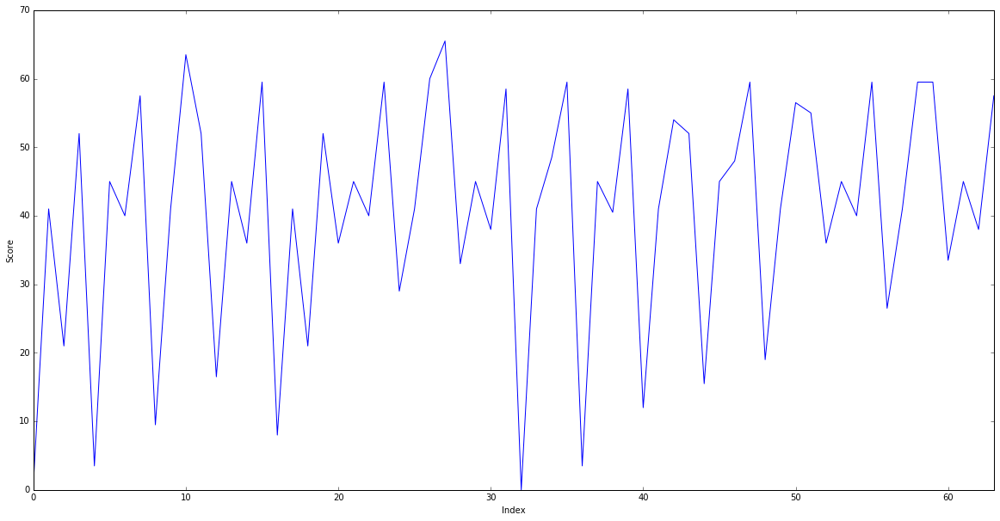

In [683]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_score)
plt.xlim([0,63])
plt.ylabel('Score')
plt.xlabel('Index')
plt.show()

This plot shows the **final score** (called `Quality indicator`) of each summary file:

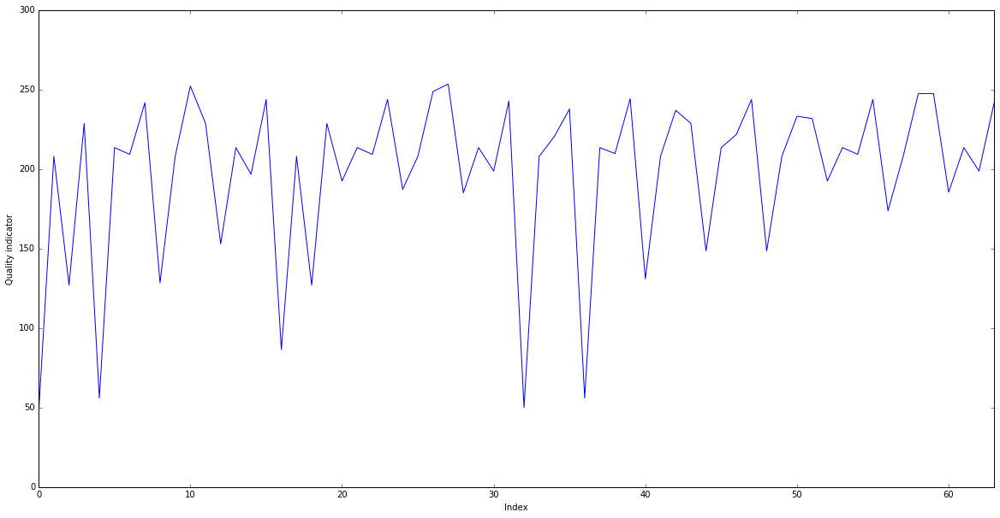

In [684]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_indic)
plt.xlim([0,63])
plt.ylabel('Quality indicator')
plt.xlabel('Index')
plt.show()

In [111]:
acumulated_indic[507]

array([ 215.5])

## Ten best results out of the 2048 cases

In [117]:
indic_comp = [(i, *value) for i, value in enumerate(acumulated_indic)]
indic_comp[0:20]

[(0, 178.5),
 (1, 180.5),
 (2, 147.5),
 (3, 155.0),
 (4, 168.5),
 (5, 170.5),
 (6, 157.0),
 (7, 184.0),
 (8, 112.0),
 (9, 120.5),
 (10, 167.5),
 (11, 166.5),
 (12, 175.0),
 (13, 197.5),
 (14, 151.0),
 (15, 169.0),
 (16, 124.5),
 (17, 114.5),
 (18, 194.25),
 (19, 178.5)]

### Top 10 

In [225]:
top_ten = [(535, 209.0),
 (49, 209.5),
 (715, 209.5),
 (913, 209.5),
 (1212, 212.0),
 (73, 213.0),
 (79, 213.0),
 (507, 215.5),
 (373, 217.0),
 (1746, 217.0)]
top_ten

[(535, 209.0),
 (49, 209.5),
 (715, 209.5),
 (913, 209.5),
 (1212, 212.0),
 (73, 213.0),
 (79, 213.0),
 (507, 215.5),
 (373, 217.0),
 (1746, 217.0)]

In [143]:
# (Index, score)
indic_comp.sort(key=lambda x: x[1])
top_ten = indic_comp[2038:]
top_ten

[(535, 209.0),
 (49, 209.5),
 (715, 209.5),
 (913, 209.5),
 (1212, 212.0),
 (73, 213.0),
 (79, 213.0),
 (507, 215.5),
 (373, 217.0),
 (1746, 217.0)]

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [226]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_10_2048.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('10 best results out of the 2048\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(10,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(10,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  64.5
Achieved by:  ['par0507']
Best quality indicator is:  252.75
Achieved by:  ['par0535']


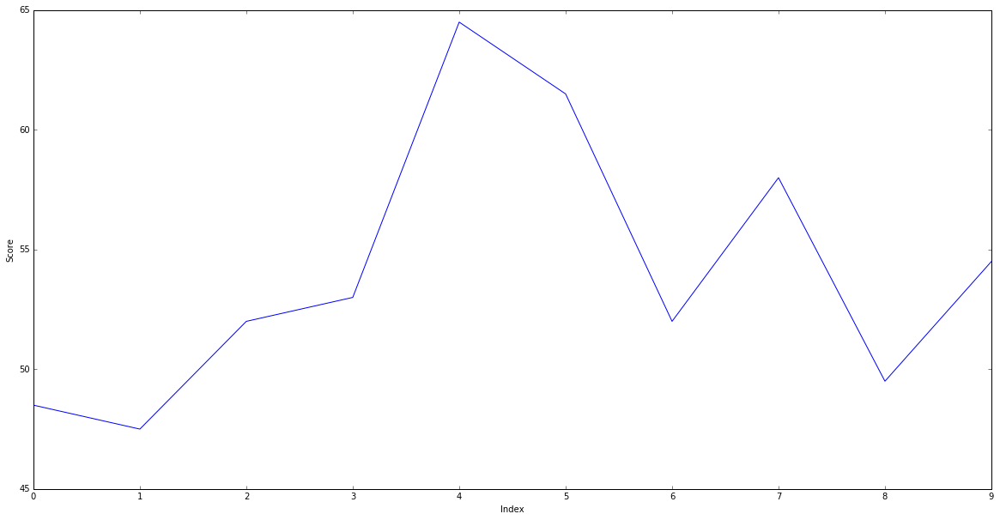

In [227]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_score)
plt.xlim([0,9])
plt.ylabel('Score')
plt.xlabel('Index')
plt.show()

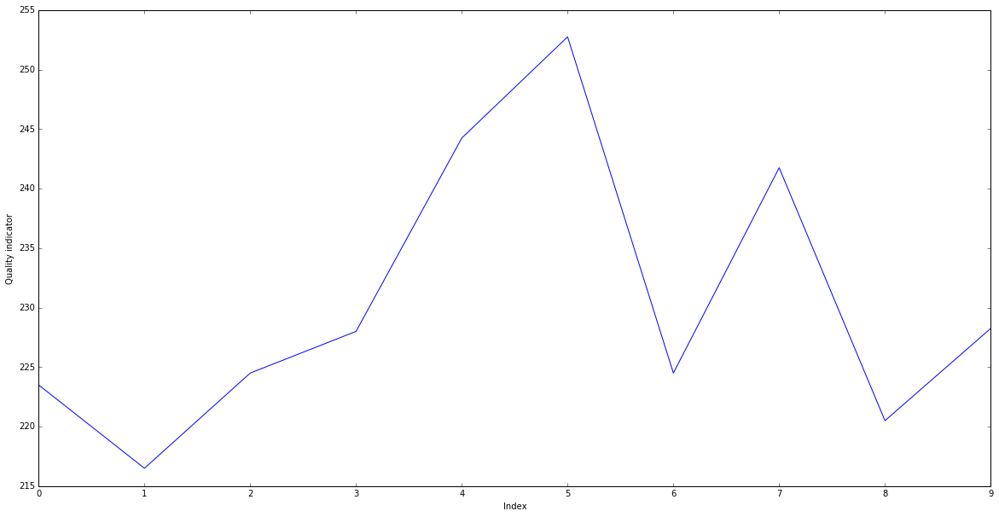

In [228]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_indic)
plt.xlim([0,9])
plt.ylabel('Quality indicator')
plt.xlabel('Index')
plt.show()

In [240]:
acumulated_indic

array([[ 223.5 ],
       [ 216.5 ],
       [ 224.5 ],
       [ 228.  ],
       [ 244.25],
       [ 252.75],
       [ 224.5 ],
       [ 241.75],
       [ 220.5 ],
       [ 228.25]])

In [258]:
acumulated_indic.tolist()[0]

[223.5]

In [262]:
index = [ind[0] for ind in top_ten]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_ten_new = list(zip(index, vals))
top_ten_new

[(49, 223.5),
 (73, 216.5),
 (79, 224.5),
 (373, 228.0),
 (507, 244.25),
 (535, 252.75),
 (715, 224.5),
 (913, 241.75),
 (1212, 220.5),
 (1746, 228.25)]

In [263]:
top_ten_new.sort(key=lambda x: x[1])
print(top_ten_new)
top_five = top_ten_new[5:]
top_five

[(73, 216.5), (1212, 220.5), (49, 223.5), (79, 224.5), (715, 224.5), (373, 228.0), (1746, 228.25), (913, 241.75), (507, 244.25), (535, 252.75)]


[(373, 228.0), (1746, 228.25), (913, 241.75), (507, 244.25), (535, 252.75)]

## Three best results out of the previous 5

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [274]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_5_10.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('5 best results out of the best 10\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(5,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(5,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  67.0
Achieved by:  ['par0507']
Best quality indicator is:  260.0
Achieved by:  ['par0535']


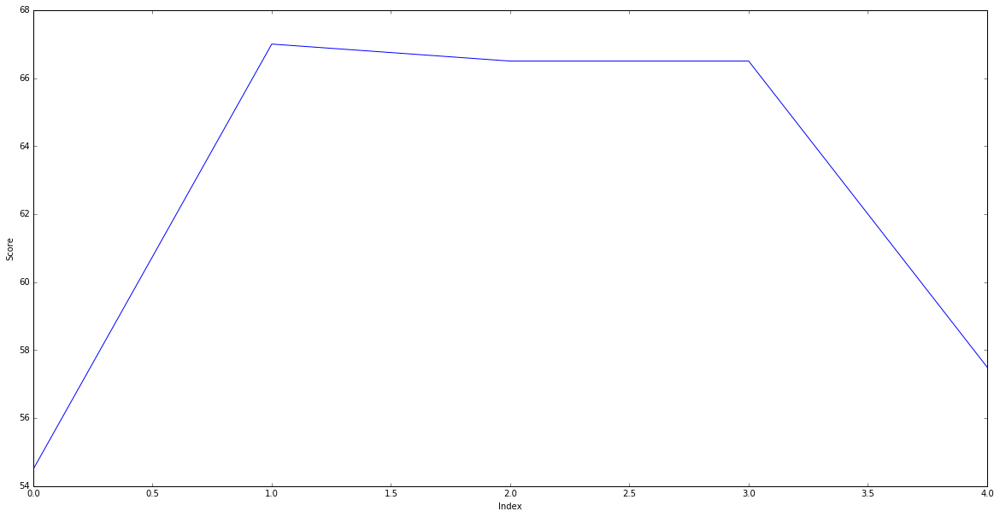

In [275]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_score)
plt.xlim([0,4])
plt.ylabel('Score')
plt.xlabel('Index')
plt.show()

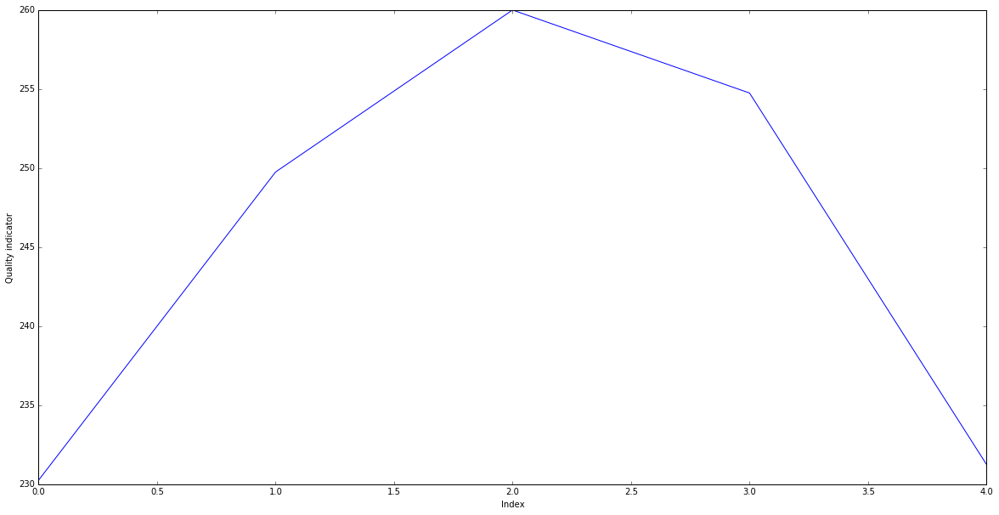

In [276]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_indic)
plt.xlim([0,4])
plt.ylabel('Quality indicator')
plt.xlabel('Index')
plt.show()

In [277]:
index = [ind[0] for ind in top_five]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_five_new = list(zip(index, vals))
top_five_new

[(373, 230.25), (507, 249.75), (535, 260.0), (913, 254.75), (1746, 231.25)]

In [278]:
top_five_new.sort(key=lambda x: x[1])
print(top_five_new)
top_three = top_five_new[2:]
top_three

[(373, 230.25), (1746, 231.25), (507, 249.75), (913, 254.75), (535, 260.0)]


[(507, 249.75), (913, 254.75), (535, 260.0)]

## Best result out of the previous 3

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [289]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_3_5.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('1 best results out of the best 3\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(3,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(3,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  80.5
Achieved by:  ['par0913']
Best quality indicator is:  268.75
Achieved by:  ['par0913']


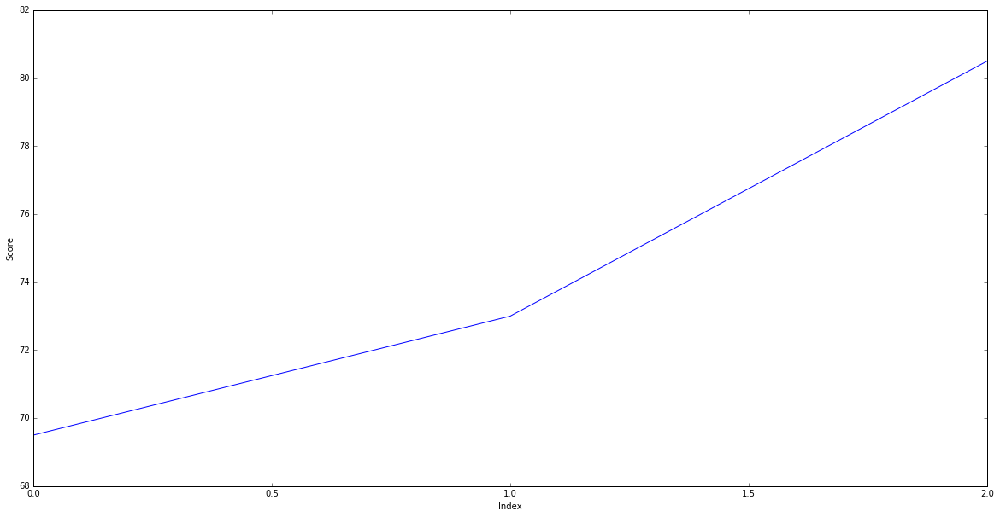

In [290]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_score)
plt.xlim([0,2])
plt.ylabel('Score')
plt.xlabel('Index')
plt.show()

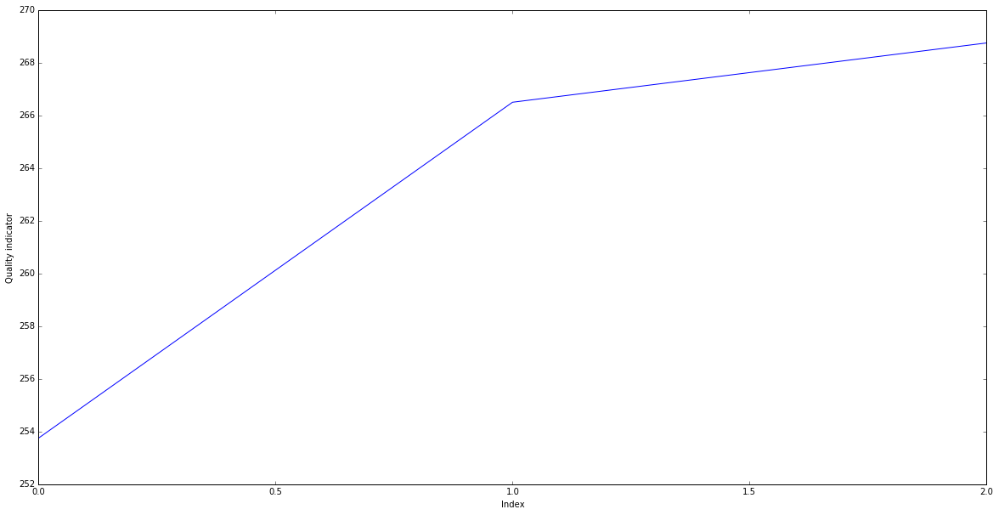

In [291]:
plt.figure(figsize=(20,10))
plt.plot(acumulated_indic)
plt.xlim([0,2])
plt.ylabel('Quality indicator')
plt.xlabel('Index')
plt.show()

In [292]:
index = [ind[0] for ind in top_three]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_three_new = list(zip(index, vals))
top_three_new

[(507, 253.75), (535, 266.5), (913, 268.75)]

In [293]:
top_three_new.sort(key=lambda x: x[1])
print(top_three_new)
top = top_three_new[2:]
top

[(507, 253.75), (535, 266.5), (913, 268.75)]


[(913, 268.75)]

# Parallel plot 

This section contains the testing and developement of code for producing a parallel coordinates plot:

https://en.wikipedia.org/wiki/Parallel_coordinates

In [21]:
import matplotlib.pyplot as plt
import matplotlib.ticker as ticker
import pandas as pd

http://stackoverflow.com/questions/8230638/parallel-coordinates-plot-in-matplotlib

http://pandas.pydata.org/pandas-docs/stable/visualization.html#parallel-coordinates

In [22]:
def parallel_coordinates(data_sets, tags=None, style=None, dots=None):

    dims = len(data_sets[0])
    x    = range(dims)
    fig, axes = plt.subplots(1, dims-1, sharey=False, figsize=(20,10))
    
    if tags is None:
        tags = ['a_' + str(i) for i in range(dims)]
    
    if style is None:
        style = ['r-'] * len(data_sets)

    # Add dots to the top 25% values of the dataset:
    if dots is None:
        dots = int(np.ceil(len(data_sets[0]) * 0.25))
    
    # Calculate the limits on the data
    min_max_range = list()
    for m in zip(*data_sets):
        mn = min(m)
        mx = max(m)
        if mn == mx:
            mn -= 0.5
            mx = mn + 1.
        r  = float(mx - mn)
        min_max_range.append((mn, mx, r))

    # Normalize the data sets
    norm_data_sets = list()
    for ds in data_sets:
        nds = [(value - min_max_range[dimension][0]) / 
                min_max_range[dimension][2] 
                for dimension,value in enumerate(ds)]
        norm_data_sets.append(nds)
    data_sets = norm_data_sets

    # Plot the datasets on all the subplots
    top_ds = data_sets[len(data_sets)-dots:]
    for i, ax in enumerate(axes):
        for dsi, d in enumerate(data_sets):
            ax.set_xlabel(tags[i])    
            ax.xaxis.set_label_coords(0, -0.05)
            ax.plot(x, d, color=str(style[dsi]))
        for dsi, d in enumerate(top_ds):
            ax.plot(x, d, color='green', marker='o', linestyle='None', markersize=10)
        ax.set_xlim([x[i], x[i+1]])
    axes[dims-2].text(dims-1, -0.065, tags[dims-1])

    # Set the x axis ticks 
    for dimension, (axx,xx) in enumerate(zip(axes, x[:-1])):
        axx.xaxis.set_major_locator(ticker.FixedLocator([xx]))
        ticks = len(axx.get_yticklabels())
        labels = list()
        step = min_max_range[dimension][2] / (ticks - 1)
        mn   = min_max_range[dimension][0]
        for i in range(ticks):
            v = mn + i*step
            labels.append('%4.2f' % v)
        axx.set_yticklabels(labels)


    # Move the final axis' ticks to the right-hand side
    axx = plt.twinx(axes[-1])
    dimension += 1
    axx.xaxis.set_major_locator(ticker.FixedLocator([x[-2], x[-1]]))
    ticks = len(axx.get_yticklabels())
    step = min_max_range[dimension][2] / (ticks - 1)
    mn   = min_max_range[dimension][0]
    labels = ['%4.2f' % (mn + i*step) for i in range(ticks)]
    axx.set_yticklabels(labels)
                
            
    # Stack the subplots 
    plt.subplots_adjust(wspace=0)

    return plt

Example of a parallel coordinate plot using the above algorithm with random numbers:

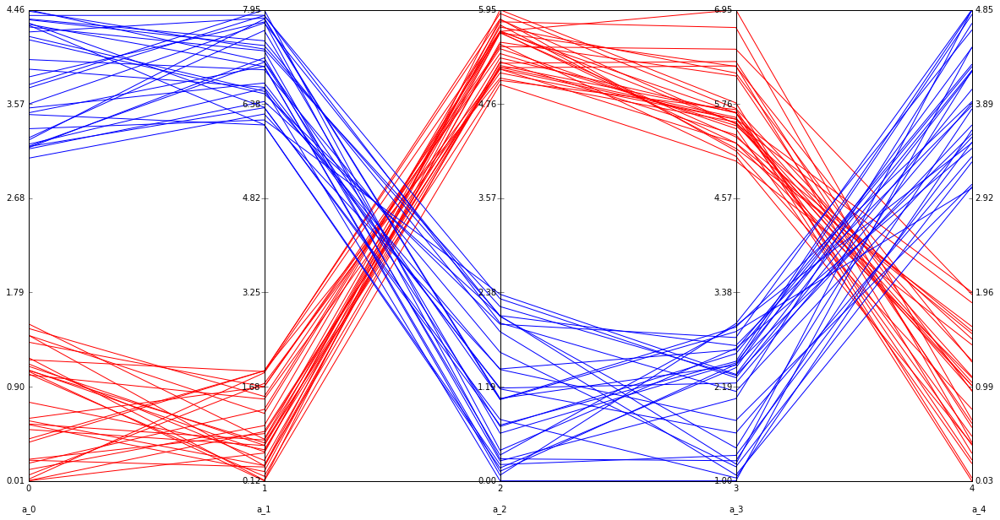

In [234]:
import random
base  = [0,   0,  5,   5,  0]
scale = [1.5, 2., 1.0, 2., 2.]
data = [[base[x] + random.uniform(0., 1.)*scale[x]
        for x in range(5)] for y in range(30)]
colors = ['r'] * 30
base  = [3,   6,  0,   1,  3]
scale = [1.5, 2., 2.5, 2., 2.]
data.extend([[base[x] + random.uniform(0., 1.)*scale[x]
             for x in range(5)] for y in range(30)])
colors.extend(['b'] * 30)
parallel_coordinates(data, style=colors).show()

Read the inputs (paramater combinations) for plotting it:

In [6]:
inputs = pd.read_excel('./Defaults_for_sensitivity_analysis.xlsm','MC')
inputs

,gWw,aSwW,mCwW,gBtR,aTl,aPl,aE,tChT,eTs,tSaE,eTs1,tSaE1,gb1,gb2,gb3
0,4.0000,4.0000,2.5000,30.0000,1.5000,0.2500,0.7000,300.0000,False,False,False,False,1.0000,1.6500,0.9600
1,2.5000,5.5000,1.7500,20.0000,0.7500,0.3750,0.7250,200.0000,True,True,True,True,0.9000,0.9750,0.9900
2,5.5000,2.5000,3.2500,40.0000,2.2500,0.1250,0.6750,400.0000,False,False,False,False,1.1000,2.3250,0.9300
3,1.7500,4.7500,3.6250,25.0000,1.1250,0.4375,0.6875,250.0000,False,False,True,False,1.0500,1.9875,0.9150
4,4.7500,1.7500,2.1250,45.0000,2.6250,0.1875,0.7375,450.0000,True,True,False,True,0.8500,0.6375,0.9750
5,3.2500,3.2500,2.8750,15.0000,0.3750,0.0625,0.7125,150.0000,True,True,False,True,1.1500,2.6625,1.0050
6,6.2500,6.2500,1.3750,35.0000,1.8750,0.3125,0.6625,350.0000,False,False,True,False,0.9500,1.3125,0.9450
7,1.3750,6.6250,3.0625,42.5000,2.8125,0.4687,0.7187,375.0000,False,True,False,True,1.0750,2.4937,0.9075
8,4.3750,3.6250,1.5625,22.5000,1.3125,0.2187,0.6687,175.0000,True,False,True,False,0.8750,1.1437,0.9675
9,2.8750,2.1250,3.8125,32.5000,2.0625,0.0937,0.6937,475.0000,True,False,True,False,1.1750,1.8187,0.9975


Pandas already has a built-in function for this kind of plots, but unfortunately we cannot use it because **the range of each of our parameters is different!**

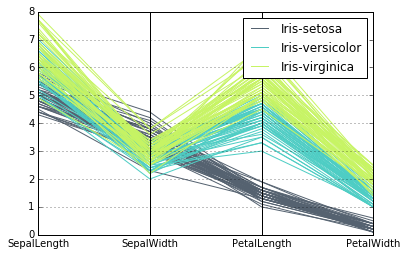

In [20]:
from pandas import read_csv
from pandas.tools.plotting import parallel_coordinates
from matplotlib import pyplot as plt
df = read_csv('https://raw.github.com/pandas-dev/pandas/master'
                    '/pandas/tests/data/iris.csv')
parallel_coordinates(df, 'Name', color=('#556270',
                         '#4ECDC4', '#C7F464'))
plt.show()

In [16]:
inputs.columns

Index(['gWw', 'aSwW', 'mCwW', 'gBtR', 'aTl', 'aPl', 'aE', 'tChT', 'eTs',
       'tSaE', 'eTs1', 'tSaE1', 'gb1', 'gb2', 'gb3'],
      dtype='object')

# Analysis from the parameter optimization - April 2017 

## Small code for retrieving the scores from the previous output txt file

When we run the previous code from Victor, a `txt` with the total scores is produced. Here we retrieve this values **as a tuple of strings**:

In [24]:
import re
pattern = re.compile("Final quality indicator of the run is: (\d{2,5})(\.)*(\d{0,2})")
results = []

for i, line in enumerate(open('Real_cars_output_post/Analysis_results_all.txt')):
    for match in re.finditer(pattern, line):
        #print('Found on line %s: %s' % (i+1, match.groups()))
        results.append(match.groups())

In [258]:
len(result)

2048

Now we transform this tuple of strings into **float values:**

In [259]:
results_float = []
for val in results:
    results_float.append(float(val[0]) + float(val[2]) * 10**(-len(val[2])))        

In [260]:
results_float[0:10]

[178.5, 180.5, 147.5, 155.0, 168.5, 170.5, 157.0, 184.0, 112.0, 120.5]

In [261]:
len(results_float)

2048

## Merge scores from the summaries with parameter combinations

Combine the parameter combinations with the scores:

In [115]:
outputs = pd.DataFrame(data = results_float, columns=['Quality_indicator'])
combined = outputs.join(inputs)
combined.head()

,Quality_indicator,gWw,aSwW,mCwW,gBtR,aTl,aPl,aE,tChT,eTs,tSaE,eTs1,tSaE1,gb1,gb2,gb3
0,178.5,4.00,4.00,2.500,30.0,1.500,0.2500,0.7000,300.0,False,False,False,False,1.00,1.6500,0.960
1,180.5,2.50,5.50,1.750,20.0,0.750,0.3750,0.7250,200.0,True,True,True,True,0.90,0.9750,0.990
2,147.5,5.50,2.50,3.250,40.0,2.250,0.1250,0.6750,400.0,False,False,False,False,1.10,2.3250,0.930
3,155.0,1.75,4.75,3.625,25.0,1.125,0.4375,0.6875,250.0,False,False,True,False,1.05,1.9875,0.915
4,168.5,4.75,1.75,2.125,45.0,2.625,0.1875,0.7375,450.0,True,True,False,True,0.85,0.6375,0.975


In [112]:
inputs.head()

,gWw,aSwW,mCwW,gBtR,aTl,aPl,aE,tChT,eTs,tSaE,eTs1,tSaE1,gb1,gb2,gb3
0,4.00,4.00,2.500,30.0,1.500,0.2500,0.7000,300.0,False,False,False,False,1.00,1.6500,0.960
1,2.50,5.50,1.750,20.0,0.750,0.3750,0.7250,200.0,True,True,True,True,0.90,0.9750,0.990
2,5.50,2.50,3.250,40.0,2.250,0.1250,0.6750,400.0,False,False,False,False,1.10,2.3250,0.930
3,1.75,4.75,3.625,25.0,1.125,0.4375,0.6875,250.0,False,False,True,False,1.05,1.9875,0.915
4,4.75,1.75,2.125,45.0,2.625,0.1875,0.7375,450.0,True,True,False,True,0.85,0.6375,0.975


## Make the actual parallel coordinates plot

In [240]:
from random import randint
colors = []

for i in range(2048):
    colors.append('#%06X' % randint(0, 0xFFFFFF))

In [236]:
labels = ['Quality'] + [lab for lab in inputs.columns]

In [246]:
plot_2048 = parallel_coordinates(combined.as_matrix(), tags=labels, style=colors)

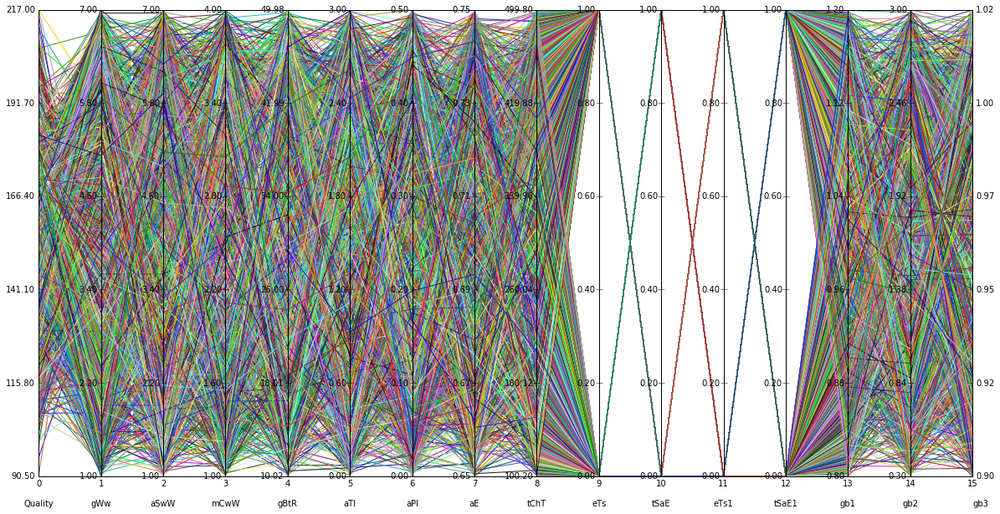

In [247]:
plot_2048.show()

## Testing how to improve the previous plot to make it more _readable_

In [262]:
all_2048 = list(zip([i for i in range(2047)], results_float))
all_2048.sort(reverse=True, key=lambda x: x[1])

In [263]:
all_2048[0:20]

[(373, 217.0),
 (1746, 217.0),
 (507, 215.5),
 (73, 213.0),
 (79, 213.0),
 (1212, 212.0),
 (49, 209.5),
 (715, 209.5),
 (913, 209.5),
 (535, 209.0),
 (581, 207.5),
 (1071, 207.5),
 (1139, 207.0),
 (1394, 207.0),
 (46, 206.5),
 (603, 205.0),
 (1221, 205.0),
 (1325, 205.0),
 (1355, 205.0),
 (829, 204.5)]

In [284]:
best_0_50_idx = [val[0] for val in all_2048[0:50]]
best_51_100_idx = [val[0] for val in all_2048[51:101]]
best_0_100_idx = [val[0] for val in all_2048[0:101]]

### Top 50 in white and 51-100 in black:

In [290]:
colors_aux = [col if not(i in best_0_50_idx) else '#FFFFFF' for i, col in enumerate(colors)]
colors_clear = [col if not(i in best_51_101_idx) else '#000000' for i, col in enumerate(colors_aux)]

In [291]:
colors_clear[0:20]

['#49AC97',
 '#3369E4',
 '#89805A',
 '#13AC25',
 '#693D2D',
 '#065177',
 '#523BD2',
 '#53EADB',
 '#EB9913',
 '#29258F',
 '#2E193E',
 '#1B9FAF',
 '#A3AF45',
 '#FFFFFF',
 '#9B2403',
 '#64C318',
 '#AC695C',
 '#2B99BC',
 '#000000',
 '#D065D9']

In [282]:
plot_2048_colored = parallel_coordinates(combined.as_matrix(), tags=labels, style=colors_clear)

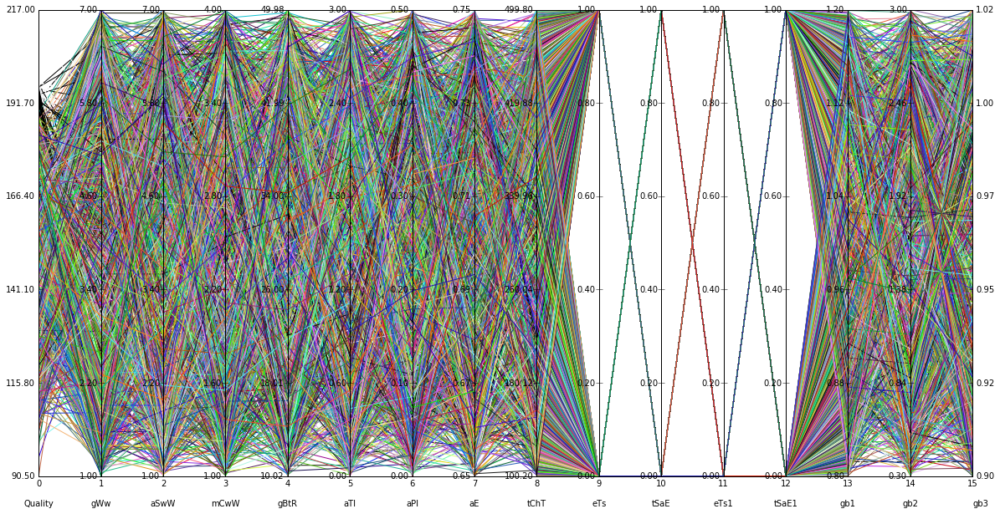

In [283]:
plot_2048_colored.show()

### Top 100 in black:

In [286]:
colors_clear = [col if not(i in best_0_100_idx) else '#000000' for i, col in enumerate(colors)]

In [287]:
plot_2048_colored = parallel_coordinates(combined.as_matrix(), tags=labels, style=colors_clear)

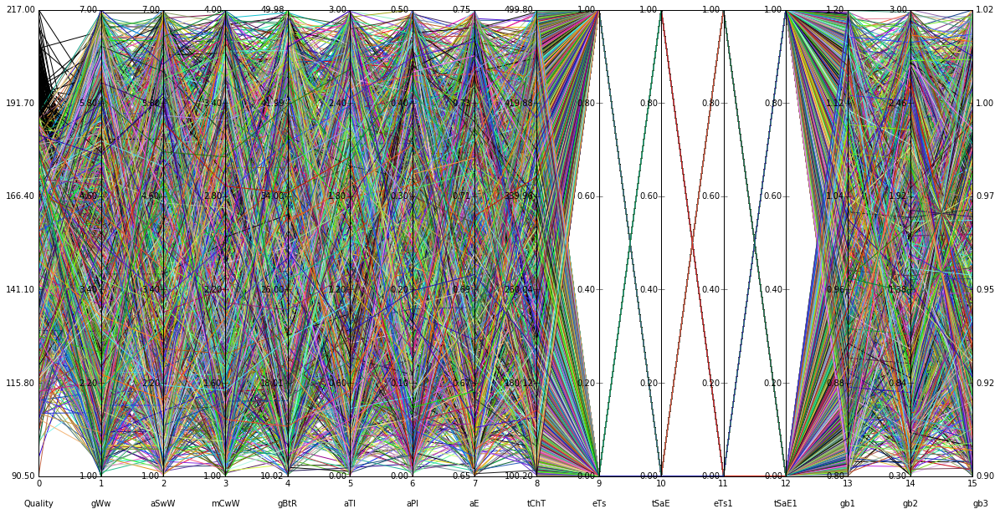

In [288]:
plot_2048_colored.show()

### Top 50 in white and 51-100 in black **in order**:

In [295]:
combined_sorted = pd.DataFrame(data=combined.sort_values('Quality_indicator', ascending=True))

In [304]:
colors_sorted = [colors_clear[combined_sorted.index[i]] for i in range(2048)]

In [309]:
plot_2048_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_sorted)

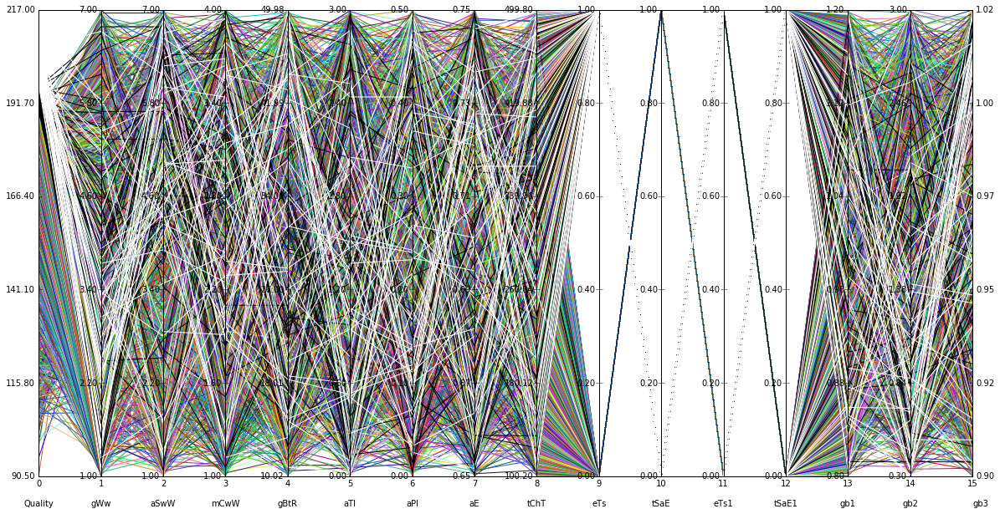

In [310]:
plot_2048_colored.show()

### Top 50 in red and 51-100 in black **in order** and the rest in light blue:

In [313]:
colors_simple_aux = ['#ADD8E6' if not(i in best_0_50_idx) else '#E50000' for i in range(2048)]
colors_simple = [col if not(i in best_51_100_idx) else '#000000' for i, col in enumerate(colors_simple_aux)]

In [314]:
colors_simple_sorted = [colors_simple[combined_sorted.index[i]] for i in range(2048)]

In [315]:
plot_2048_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_simple_sorted)

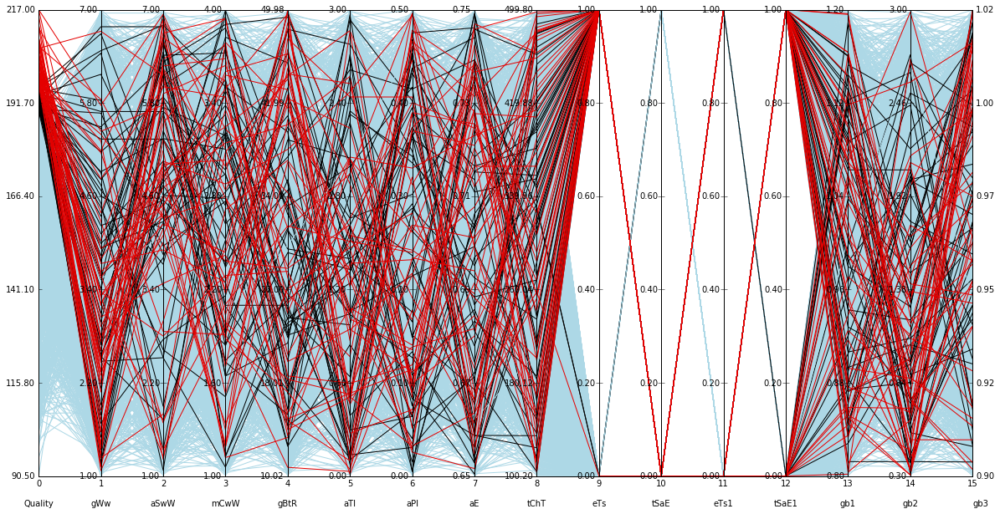

In [316]:
plot_2048_colored.show()

## Improved plot

### Top 10 in red and 11-20 in black **in order** and the rest in light blue, plus some green dots:

In [317]:
colors_simple_aux = ['#ADD8E6' if not(i in best_0_50_idx[0:10]) else '#E50000' for i in range(2048)]
colors_simple = [col if not(i in best_0_50_idx[10:21]) else '#000000' for i, col in enumerate(colors_simple_aux)]

In [318]:
colors_simple_sorted = [colors_simple[combined_sorted.index[i]] for i in range(2048)]

In [408]:
plot_2048_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_simple_sorted, dots=20)

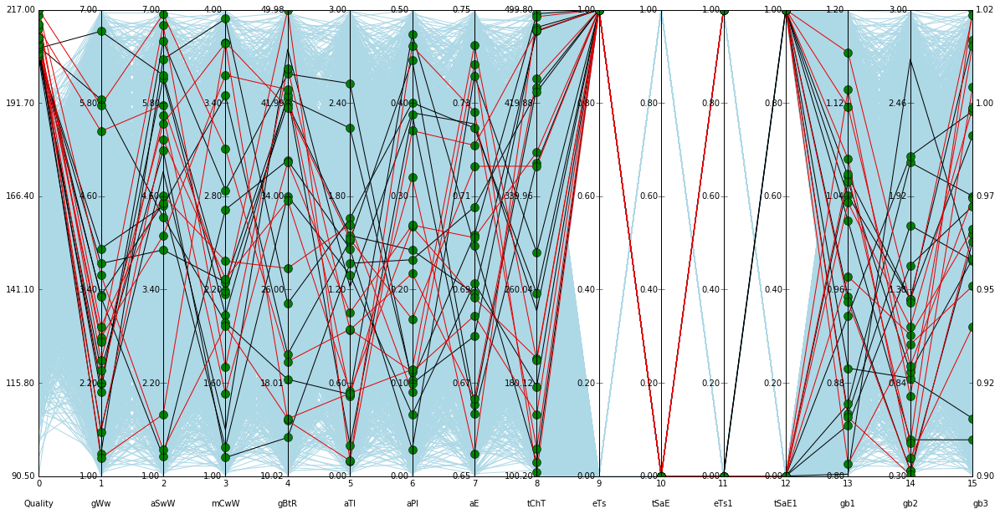

In [409]:
plot_2048_colored.show()

###### Restrict to:

`eTs=1
tSaE=0
gWv < 4
aSwW > 3.5
aTl < 1.8
gb2 < 1.35`

As discussed in https://github.com/JRCSTU/co2mpas/issues/391#issuecomment-299232867

In [415]:
comb_mat = combined_sorted.as_matrix()

In [428]:
print(len(comb_mat))
comb_mat[0]

2048


array([90.5, 6.2822, 3.9854, 3.2222, 33.2617, 2.0933, 0.2795, 0.7071,
       468.5547, False, False, True, False, 1.16, 2.8879, 0.967], dtype=object)

In [444]:
# In this line I introduce fake data in order to maintain the same axes ranges as before (it is painted in white)
combined_restrict = [[90.5, 7, 7, 4, 49.98, 3, 0.5, 0.75, \
                      499.8, True, True, True, True, 1.2, 3, 1.02], \
                     [90.5, 1, 1, 1, 10.02, 0, 0, 0.65, \
                      100.2, False, False, False, False, 0.8, 0.3, 0.9]]
for i in range(len(combined_sorted)):
    if comb_mat[i][9] == 1 and comb_mat[i][10] == 0 and comb_mat[i][1] < 4 and \
          comb_mat[i][2] > 3.5 and  comb_mat[i][5] < 1.8 and comb_mat[i][14] < 1.35:
        combined_restrict.append(comb_mat[i])

In [435]:
len(combined_restrict)

39

In [437]:
colors_restrict = ['w'] * 2 + ['g']*37

In [445]:
plot_restrict = parallel_coordinates(combined_restrict, tags=labels, style=colors_restrict, dots=37)

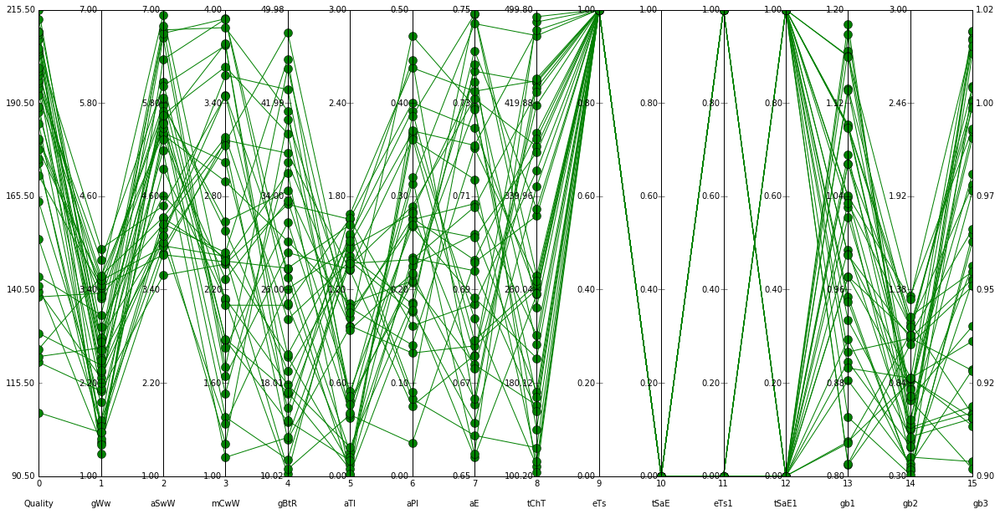

In [446]:
plot_restrict.show()

### Save score and parameters into a Excel file 

In [450]:
combined_sorted.head()

,Quality_indicator,gWw,aSwW,mCwW,gBtR,aTl,aPl,aE,tChT,eTs,tSaE,eTs1,tSaE1,gb1,gb2,gb3
1670,90.5,6.2822,3.9854,3.2222,33.2617,2.0933,0.2795,0.7071,468.5547,False,False,True,False,1.1600,2.8879,0.9670
1037,95.5,3.6279,2.1396,2.3931,19.1602,0.5786,0.2361,0.6886,212.6953,False,True,True,False,1.0604,1.3033,0.9434
334,98.0,6.6836,2.3711,3.9824,44.2969,0.5801,0.0908,0.6564,380.4687,False,True,True,False,0.9727,0.3053,0.9171
113,99.5,2.8281,2.0781,2.0547,18.4375,0.2578,0.3633,0.7117,121.8750,True,False,True,False,1.0781,2.8102,1.0153
1354,99.5,5.9365,2.3623,2.4106,27.6758,2.0728,0.2000,0.6509,118.1641,True,False,True,False,0.8877,2.4898,0.9788


In [453]:
combined_sorted.to_csv('Parameters_with_scores')

# Analysis from the parameter optimization - June 2017 

## First launch

When we run the previous code from Victor, a `txt` with the total scores is produced. Here we retrieve this values **as a tuple of strings**:

In [52]:
import re
pattern = re.compile("Final quality indicator of the run is: (\d{2,5})(\.)*(\d{0,2})")
results = []

for i, line in enumerate(open('../Real_cars_output_june_post/Analysis_results_all.txt')):
    for match in re.finditer(pattern, line):
        #print('Found on line %s: %s' % (i+1, match.groups()))
        results.append(match.groups())

In [95]:
inputs = pd.read_excel('../Parameter_combination_June.xlsx','Tuning')
inputs

,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify
0,False,False,False,False,False,False
1,False,False,False,False,False,True
2,False,False,False,False,True,False
3,False,False,False,False,True,True
4,False,False,False,True,False,False
5,False,False,False,True,False,True
6,False,False,False,True,True,False
7,False,False,False,True,True,True
8,False,False,True,False,False,False
9,False,False,True,False,False,True


Convert scores to floats and sort them:

In [61]:
results_float = []
for val in results:
    results_float.append(float(val[0]) + float(val[2]) * 10**(-len(val[2])))     
all_64 = list(zip([i for i in range(64)], results_float))
all_64.sort(reverse=True, key=lambda x: x[1])
all_64[0:20]

[(50, 236.75),
 (51, 236.75),
 (28, 227.5),
 (29, 227.5),
 (58, 227.25),
 (59, 227.25),
 (62, 226.5),
 (63, 226.5),
 (26, 219.5),
 (27, 219.5),
 (30, 210.5),
 (31, 210.5),
 (54, 199.5),
 (55, 199.5),
 (52, 198.25),
 (53, 198.25),
 (24, 197.5),
 (25, 197.5),
 (60, 193.0),
 (61, 193.0)]

Pick how many of the first ones will be highlighted in the plot in red:
```
#E50000 => RED
#ADD8E6 => LIGHT BLUE
```

In [79]:
best_0_6_idx = [val[0] for val in all_64[0:6]]
colors_simple = ['#ADD8E6' if not(i in best_0_6_idx) else '#E50000' for i in range(64)]

In [80]:
outputs = pd.DataFrame(data=results_float, columns=['Quality_indicator'])
combined = outputs.join(inputs)

In [81]:
combined_sorted = pd.DataFrame(data=combined.sort_values('Quality_indicator', ascending=True))
colors_sorted = [colors_simple[combined_sorted.index[i]] for i in range(64)]

In [82]:
[(combined_sorted.index[i], colors_sorted[i]) for i in range(64)]

[(0, '#ADD8E6'),
 (1, '#ADD8E6'),
 (2, '#ADD8E6'),
 (3, '#ADD8E6'),
 (4, '#ADD8E6'),
 (5, '#ADD8E6'),
 (6, '#ADD8E6'),
 (7, '#ADD8E6'),
 (33, '#ADD8E6'),
 (32, '#ADD8E6'),
 (37, '#ADD8E6'),
 (36, '#ADD8E6'),
 (44, '#ADD8E6'),
 (45, '#ADD8E6'),
 (20, '#ADD8E6'),
 (21, '#ADD8E6'),
 (35, '#ADD8E6'),
 (34, '#ADD8E6'),
 (38, '#ADD8E6'),
 (39, '#ADD8E6'),
 (22, '#ADD8E6'),
 (16, '#ADD8E6'),
 (17, '#ADD8E6'),
 (18, '#ADD8E6'),
 (19, '#ADD8E6'),
 (23, '#ADD8E6'),
 (8, '#ADD8E6'),
 (9, '#ADD8E6'),
 (13, '#ADD8E6'),
 (12, '#ADD8E6'),
 (11, '#ADD8E6'),
 (10, '#ADD8E6'),
 (40, '#ADD8E6'),
 (41, '#ADD8E6'),
 (42, '#ADD8E6'),
 (43, '#ADD8E6'),
 (47, '#ADD8E6'),
 (46, '#ADD8E6'),
 (14, '#ADD8E6'),
 (15, '#ADD8E6'),
 (48, '#ADD8E6'),
 (49, '#ADD8E6'),
 (57, '#ADD8E6'),
 (56, '#ADD8E6'),
 (60, '#ADD8E6'),
 (61, '#ADD8E6'),
 (25, '#ADD8E6'),
 (24, '#ADD8E6'),
 (53, '#ADD8E6'),
 (52, '#ADD8E6'),
 (55, '#ADD8E6'),
 (54, '#ADD8E6'),
 (31, '#ADD8E6'),
 (30, '#ADD8E6'),
 (27, '#ADD8E6'),
 (26, '#ADD8E6'),
 (

In [83]:
combined_sorted

,Quality_indicator,enable_first_step_params,enable_second_step_params,enable_third_step_params,enable_first_step_emissions,enable_second_step_emissions,enable_third_step_emissions
0,59.50,False,False,False,False,False,False
1,59.50,False,False,False,False,False,True
2,59.50,False,False,False,False,True,False
3,59.50,False,False,False,False,True,True
4,59.50,False,False,False,True,False,False
5,59.50,False,False,False,True,False,True
6,59.50,False,False,False,True,True,False
7,59.50,False,False,False,True,True,True
33,84.50,True,False,False,False,False,True
32,84.50,True,False,False,False,False,False


In [84]:
labels = ['Quality'] + [lab for lab in inputs.columns]
plot_64_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_sorted, dots=0)

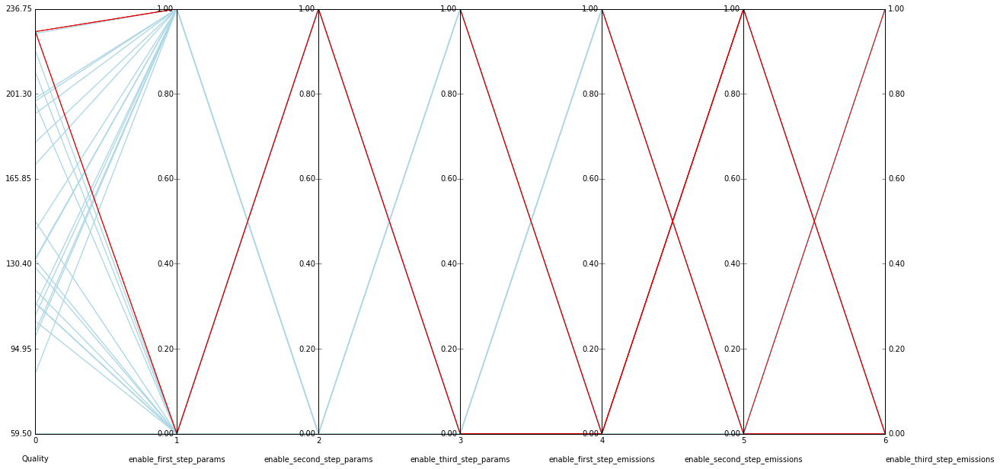

In [85]:
plot_64_colored.show()

## Second launch 

### For the 64 files

When we run the previous code from Victor, a `txt` with the total scores is produced. Here we retrieve this values **as a tuple of strings**:

In [25]:
import re
pattern = re.compile("Final quality indicator of the run is: (\d{2,5})(\.)*(\d{0,2})")
results = []

for i, line in enumerate(open('../Real_cars_output_last_post/Analysis_results_all.txt')):
    for match in re.finditer(pattern, line):
        #print('Found on line %s: %s' % (i+1, match.groups()))
        results.append(match.groups())

In [96]:
inputs = pd.read_excel('../Parameter_combination_June.xlsx','Tuning')
inputs

,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify
0,False,False,False,False,False,False
1,False,False,False,False,False,True
2,False,False,False,False,True,False
3,False,False,False,False,True,True
4,False,False,False,True,False,False
5,False,False,False,True,False,True
6,False,False,False,True,True,False
7,False,False,False,True,True,True
8,False,False,True,False,False,False
9,False,False,True,False,False,True


Convert scores to floats and sort them:

In [97]:
results_float = []
for val in results:
    results_float.append(float(val[0]) + float(val[2]) * 10**(-len(val[2])))     
all_64 = list(zip([i for i in range(64)], results_float))
all_64.sort(reverse=True, key=lambda x: x[1])
all_64[0:20]

[(26, 259.0),
 (27, 259.0),
 (14, 234.5),
 (15, 234.5),
 (30, 234.5),
 (31, 234.5),
 (54, 222.5),
 (55, 222.5),
 (46, 219.0),
 (47, 219.0),
 (50, 211.0),
 (51, 211.0),
 (58, 208.5),
 (59, 208.5),
 (52, 207.25),
 (53, 207.25),
 (62, 207.0),
 (63, 207.0),
 (42, 205.0),
 (43, 205.0)]

Pick how many of the first ones will be highlighted in the plot in red:
```
#E50000 => RED
#ADD8E6 => LIGHT BLUE
```

In [98]:
best_0_14_idx = [val[0] for val in all_64[0:14]]
colors_simple = ['#ADD8E6' if not(i in best_0_14_idx) else '#E50000' for i in range(64)]

Get the run time of every batch:

In [80]:
os.chdir(workdir)
elapsed = []
for file in glob.glob("*summary.xlsx"):
    aux = pd.read_excel(file, 'proc_info')
    elapsed.append(float(aux['Value'][2].split()[0]))

**Combine** scores, inputs and elapsed time:

In [99]:
outputs = pd.DataFrame(data=results_float, columns=['Quality_indicator'])
elapsed_df = pd.DataFrame(data=elapsed, columns=['Elapsed_time'])
combined = outputs.join(inputs).join(elapsed_df)

In [100]:
combined_sorted = pd.DataFrame(data=combined.sort_values('Quality_indicator', ascending=True))
colors_sorted = [colors_simple[combined_sorted.index[i]] for i in range(64)]

In [101]:
[(combined_sorted.index[i], colors_sorted[i]) for i in range(64)]

[(0, '#ADD8E6'),
 (1, '#ADD8E6'),
 (2, '#ADD8E6'),
 (3, '#ADD8E6'),
 (4, '#ADD8E6'),
 (5, '#ADD8E6'),
 (6, '#ADD8E6'),
 (7, '#ADD8E6'),
 (32, '#ADD8E6'),
 (33, '#ADD8E6'),
 (39, '#ADD8E6'),
 (38, '#ADD8E6'),
 (35, '#ADD8E6'),
 (34, '#ADD8E6'),
 (37, '#ADD8E6'),
 (36, '#ADD8E6'),
 (16, '#ADD8E6'),
 (17, '#ADD8E6'),
 (21, '#ADD8E6'),
 (20, '#ADD8E6'),
 (23, '#ADD8E6'),
 (22, '#ADD8E6'),
 (8, '#ADD8E6'),
 (9, '#ADD8E6'),
 (18, '#ADD8E6'),
 (19, '#ADD8E6'),
 (41, '#ADD8E6'),
 (40, '#ADD8E6'),
 (48, '#ADD8E6'),
 (49, '#ADD8E6'),
 (44, '#ADD8E6'),
 (45, '#ADD8E6'),
 (13, '#ADD8E6'),
 (12, '#ADD8E6'),
 (56, '#ADD8E6'),
 (57, '#ADD8E6'),
 (28, '#ADD8E6'),
 (29, '#ADD8E6'),
 (25, '#ADD8E6'),
 (24, '#ADD8E6'),
 (11, '#ADD8E6'),
 (10, '#ADD8E6'),
 (60, '#ADD8E6'),
 (61, '#ADD8E6'),
 (42, '#ADD8E6'),
 (43, '#ADD8E6'),
 (63, '#ADD8E6'),
 (62, '#ADD8E6'),
 (52, '#ADD8E6'),
 (53, '#ADD8E6'),
 (59, '#E50000'),
 (58, '#E50000'),
 (50, '#E50000'),
 (51, '#E50000'),
 (47, '#E50000'),
 (46, '#E50000'),
 (

In [102]:
combined_sorted

,Quality_indicator,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify,Elapsed_time
0,47.00,False,False,False,False,False,False,2980.941
1,47.00,False,False,False,False,False,True,2983.495
2,47.00,False,False,False,False,True,False,4199.229
3,47.00,False,False,False,False,True,True,4148.919
4,47.00,False,False,False,True,False,False,3280.380
5,47.00,False,False,False,True,False,True,3274.453
6,47.00,False,False,False,True,True,False,5043.252
7,47.00,False,False,False,True,True,True,4973.738
32,50.50,True,False,False,False,False,False,3011.509
33,50.50,True,False,False,False,False,True,3020.462


In [158]:
combined_sorted[combined_sorted[['enable_first_step_calibrate', 'enable_second_step_calibrate', 'enable_third_step_calibrate']].sum(axis = 1) == 3]

,Quality_indicator,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify,Elapsed_time
56,175.0,True,True,True,False,False,False,3202.748
57,175.0,True,True,True,False,False,True,3250.838
60,204.0,True,True,True,True,False,False,3590.375
61,204.0,True,True,True,True,False,True,3600.025
63,207.0,True,True,True,True,True,True,5328.253
62,207.0,True,True,True,True,True,False,5393.461
59,208.5,True,True,True,False,True,True,4493.531
58,208.5,True,True,True,False,True,False,4462.531


In [103]:
labels = ['Quality'] + [lab for lab in inputs.columns] + [lab for lab in elapsed_df.columns]
plot_64_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_sorted, dots=0)

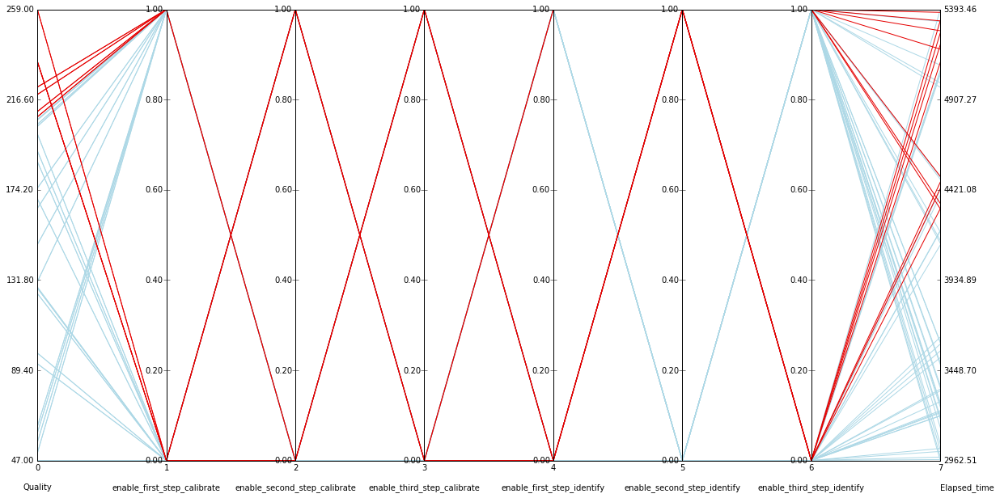

In [104]:
plot_64_colored.show()

### Top 14 out of the 64

In [117]:
indic_comp = [(i, *value) for i, value in enumerate(acumulated_indic)]
indic_comp[0:20]

[(0, 47.0),
 (1, 47.0),
 (2, 47.0),
 (3, 47.0),
 (4, 47.0),
 (5, 47.0),
 (6, 47.0),
 (7, 47.0),
 (8, 128.0),
 (9, 128.0),
 (10, 200.5),
 (11, 200.5),
 (12, 170.0),
 (13, 170.0),
 (14, 234.5),
 (15, 234.5),
 (16, 92.5),
 (17, 92.5),
 (18, 128.5),
 (19, 128.5)]

In [118]:
# (Index, score)
indic_comp.sort(key=lambda x: x[1])
top_14 = indic_comp[50:]
top_14

[(58, 208.5),
 (59, 208.5),
 (50, 211.0),
 (51, 211.0),
 (46, 219.0),
 (47, 219.0),
 (54, 222.5),
 (55, 222.5),
 (14, 234.5),
 (15, 234.5),
 (30, 234.5),
 (31, 234.5),
 (26, 259.0),
 (27, 259.0)]

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [131]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_14_64.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('14 best results out of the 64\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(14,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(14,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  69.0
Achieved by:  ['par0026', 'par0027']
Best quality indicator is:  264.5
Achieved by:  ['par0026', 'par0027']


In [134]:
acumulated_indic

array([[ 241.  ],
       [ 241.  ],
       [ 264.5 ],
       [ 264.5 ],
       [ 235.  ],
       [ 235.  ],
       [ 227.75],
       [ 227.75],
       [ 223.25],
       [ 223.25],
       [ 245.5 ],
       [ 245.5 ],
       [ 211.5 ],
       [ 211.5 ]])

In [258]:
acumulated_indic.tolist()[0]

[223.5]

In [135]:
index = [ind[0] for ind in top_14]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_14_new = list(zip(index, vals))
top_14_new

[(14, 241.0),
 (15, 241.0),
 (26, 264.5),
 (27, 264.5),
 (30, 235.0),
 (31, 235.0),
 (46, 227.75),
 (47, 227.75),
 (50, 223.25),
 (51, 223.25),
 (54, 245.5),
 (55, 245.5),
 (58, 211.5),
 (59, 211.5)]

In [138]:
top_14_new.sort(key=lambda x: x[1])
print(top_14_new)
top_6 = top_14_new[8:]
top_6

[(58, 211.5), (59, 211.5), (50, 223.25), (51, 223.25), (46, 227.75), (47, 227.75), (30, 235.0), (31, 235.0), (14, 241.0), (15, 241.0), (54, 245.5), (55, 245.5), (26, 264.5), (27, 264.5)]


[(14, 241.0), (15, 241.0), (54, 245.5), (55, 245.5), (26, 264.5), (27, 264.5)]

### Top 6 out of the 14

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [150]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_6_14.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('6 best results out of the 14\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(6,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(6,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  78.5
Achieved by:  ['par0026', 'par0027']
Best quality indicator is:  276.25
Achieved by:  ['par0026', 'par0027']


In [153]:
acumulated_indic

array([[ 251.25],
       [ 251.25],
       [ 276.25],
       [ 276.25],
       [ 253.  ],
       [ 253.  ]])

In [154]:
index = [ind[0] for ind in top_6]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_6_new = list(zip(index, vals))
top_6_new

[(14, 251.25),
 (15, 251.25),
 (26, 276.25),
 (27, 276.25),
 (54, 253.0),
 (55, 253.0)]

In [155]:
top_6_new.sort(key=lambda x: x[1])
print(top_6_new)

[(14, 251.25), (15, 251.25), (54, 253.0), (55, 253.0), (26, 276.25), (27, 276.25)]


### Modify _UDC, EUDC and NEDC_ times 1.005 for the second launch

In [318]:
os.chdir(workdir)
idx = pd.IndexSlice
for file in glob.glob("*summary.xlsx"):
    summary = pd.read_excel(file, 'summary', header=[0, 1, 2, 3], index_col=[0], skiprows=[4])
    proc_info = pd.read_excel(file, 'proc_info')
    summary.loc[:, idx['nedc_h', 'prediction', 'output', 'UDC']] *= 1.005
    summary.loc[:, idx['nedc_h', 'prediction', 'output', 'EUDC']] *= 1.005
    summary.loc[:, idx['nedc_h', 'prediction', 'output', 'value']] *= 1.005
    writer = pd.ExcelWriter('../Real_cars_output_1_005/' + file)
    summary.to_excel(writer, 'summary')
    proc_info.to_excel(writer, 'proc_info')
    writer.save()

In [335]:
import re
pattern = re.compile("Final quality indicator of the run is: (\d{2,5})(\.)*(\d{0,2})")
results = []

for i, line in enumerate(open('../Real_cars_output_1_005/Analysis_results_all.txt')):
    for match in re.finditer(pattern, line):
        #print('Found on line %s: %s' % (i+1, match.groups()))
        results.append(match.groups())

In [336]:
inputs = pd.read_excel('../Parameter_combination_June.xlsx','Tuning')
inputs

,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify
0,False,False,False,False,False,False
1,False,False,False,False,False,True
2,False,False,False,False,True,False
3,False,False,False,False,True,True
4,False,False,False,True,False,False
5,False,False,False,True,False,True
6,False,False,False,True,True,False
7,False,False,False,True,True,True
8,False,False,True,False,False,False
9,False,False,True,False,False,True


In [337]:
results_float = []
for val in results:
    results_float.append(float(val[0]) + float(val[2]) * 10**(-len(val[2])))     
all_64 = list(zip([i for i in range(64)], results_float))
all_64.sort(reverse=True, key=lambda x: x[1])
all_64[0:20]

[(26, 262.0),
 (27, 262.0),
 (14, 257.5),
 (15, 257.5),
 (54, 253.5),
 (55, 253.5),
 (46, 250.5),
 (47, 250.5),
 (30, 241.0),
 (31, 241.0),
 (42, 236.0),
 (43, 236.0),
 (62, 235.5),
 (63, 235.5),
 (50, 234.5),
 (51, 234.5),
 (58, 232.5),
 (59, 232.5),
 (10, 218.0),
 (11, 218.0)]

In [338]:
best_0_14_idx = [val[0] for val in all_64[0:14]]
colors_simple = ['#ADD8E6' if not(i in best_0_14_idx) else '#E50000' for i in range(64)]

In [341]:
outputs = pd.DataFrame(data=results_float, columns=['Quality_indicator'])
elapsed_df = pd.DataFrame(data=elapsed, columns=['Elapsed_time'])
combined = outputs.join(inputs).join(elapsed_df)

In [342]:
combined_sorted = pd.DataFrame(data=combined.sort_values('Quality_indicator', ascending=True))
colors_sorted = [colors_simple[combined_sorted.index[i]] for i in range(64)]

In [343]:
[(combined_sorted.index[i], colors_sorted[i]) for i in range(64)]

[(0, '#ADD8E6'),
 (1, '#ADD8E6'),
 (2, '#ADD8E6'),
 (3, '#ADD8E6'),
 (4, '#ADD8E6'),
 (5, '#ADD8E6'),
 (6, '#ADD8E6'),
 (7, '#ADD8E6'),
 (33, '#ADD8E6'),
 (32, '#ADD8E6'),
 (38, '#ADD8E6'),
 (39, '#ADD8E6'),
 (34, '#ADD8E6'),
 (35, '#ADD8E6'),
 (37, '#ADD8E6'),
 (36, '#ADD8E6'),
 (21, '#ADD8E6'),
 (20, '#ADD8E6'),
 (16, '#ADD8E6'),
 (17, '#ADD8E6'),
 (18, '#ADD8E6'),
 (19, '#ADD8E6'),
 (22, '#ADD8E6'),
 (23, '#ADD8E6'),
 (9, '#ADD8E6'),
 (8, '#ADD8E6'),
 (40, '#ADD8E6'),
 (41, '#ADD8E6'),
 (49, '#ADD8E6'),
 (48, '#ADD8E6'),
 (12, '#ADD8E6'),
 (13, '#ADD8E6'),
 (45, '#ADD8E6'),
 (44, '#ADD8E6'),
 (28, '#ADD8E6'),
 (29, '#ADD8E6'),
 (56, '#ADD8E6'),
 (57, '#ADD8E6'),
 (25, '#ADD8E6'),
 (24, '#ADD8E6'),
 (60, '#ADD8E6'),
 (61, '#ADD8E6'),
 (53, '#ADD8E6'),
 (52, '#ADD8E6'),
 (11, '#ADD8E6'),
 (10, '#ADD8E6'),
 (59, '#ADD8E6'),
 (58, '#ADD8E6'),
 (51, '#ADD8E6'),
 (50, '#ADD8E6'),
 (63, '#E50000'),
 (62, '#E50000'),
 (43, '#E50000'),
 (42, '#E50000'),
 (30, '#E50000'),
 (31, '#E50000'),
 (

In [344]:
combined_sorted

,Quality_indicator,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify,Elapsed_time
0,45.00,False,False,False,False,False,False,2980.941
1,45.00,False,False,False,False,False,True,2983.495
2,45.00,False,False,False,False,True,False,4199.229
3,45.00,False,False,False,False,True,True,4148.919
4,45.00,False,False,False,True,False,False,3280.380
5,45.00,False,False,False,True,False,True,3274.453
6,45.00,False,False,False,True,True,False,5043.252
7,45.00,False,False,False,True,True,True,4973.738
33,50.50,True,False,False,False,False,True,3020.462
32,50.50,True,False,False,False,False,False,3011.509


In [346]:
labels = ['Quality'] + [lab for lab in inputs.columns] + [lab for lab in elapsed_df.columns]
plot_64_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_sorted, dots=0)

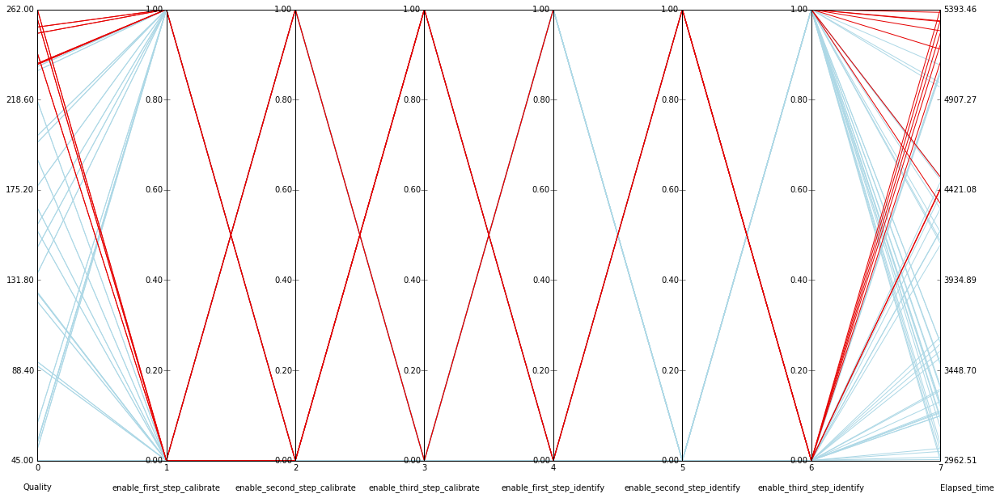

In [347]:
plot_64_colored.show()

Get the run time of every batch:

In [340]:
os.chdir(workdir)
elapsed = []
for file in glob.glob("*summary.xlsx"):
    aux = pd.read_excel(file, 'proc_info')
    elapsed.append(float(aux['Value'][2].split()[0]))

### Top 14 out of the 64

In [348]:
indic_comp = [(i, *value) for i, value in enumerate(acumulated_indic)]
indic_comp[0:20]

[(0, 45.0),
 (1, 45.0),
 (2, 45.0),
 (3, 45.0),
 (4, 45.0),
 (5, 45.0),
 (6, 45.0),
 (7, 45.0),
 (8, 126.0),
 (9, 126.0),
 (10, 218.0),
 (11, 218.0),
 (12, 155.5),
 (13, 155.5),
 (14, 257.5),
 (15, 257.5),
 (16, 92.5),
 (17, 92.5),
 (18, 121.5),
 (19, 121.5)]

In [349]:
# (Index, score)
indic_comp.sort(key=lambda x: x[1])
top_14 = indic_comp[50:]
top_14

[(62, 235.5),
 (63, 235.5),
 (42, 236.0),
 (43, 236.0),
 (30, 241.0),
 (31, 241.0),
 (46, 250.5),
 (47, 250.5),
 (54, 253.5),
 (55, 253.5),
 (14, 257.5),
 (15, 257.5),
 (26, 262.0),
 (27, 262.0)]

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [360]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_14_64.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('14 best results out of the 64\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(14,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(14,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  73.5
Achieved by:  ['par0054', 'par0055']
Best quality indicator is:  269.0
Achieved by:  ['par0054', 'par0055']


In [361]:
acumulated_indic

array([[ 264.  ],
       [ 264.  ],
       [ 265.5 ],
       [ 265.5 ],
       [ 241.5 ],
       [ 241.5 ],
       [ 245.  ],
       [ 245.  ],
       [ 251.75],
       [ 251.75],
       [ 269.  ],
       [ 269.  ],
       [ 235.5 ],
       [ 235.5 ]])

In [362]:
index = [ind[0] for ind in top_14]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_14_new = list(zip(index, vals))
top_14_new

[(14, 264.0),
 (15, 264.0),
 (26, 265.5),
 (27, 265.5),
 (30, 241.5),
 (31, 241.5),
 (42, 245.0),
 (43, 245.0),
 (46, 251.75),
 (47, 251.75),
 (54, 269.0),
 (55, 269.0),
 (62, 235.5),
 (63, 235.5)]

In [363]:
top_14_new.sort(key=lambda x: x[1])
print(top_14_new)
top_6 = top_14_new[8:]
top_6

[(62, 235.5), (63, 235.5), (30, 241.5), (31, 241.5), (42, 245.0), (43, 245.0), (46, 251.75), (47, 251.75), (14, 264.0), (15, 264.0), (26, 265.5), (27, 265.5), (54, 269.0), (55, 269.0)]


[(14, 264.0), (15, 264.0), (26, 265.5), (27, 265.5), (54, 269.0), (55, 269.0)]

### Top 6 out of the 14

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [374]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_6_14.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('6 best results out of the 14\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(6,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(6,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  80.5
Achieved by:  ['par0026', 'par0027']
Best quality indicator is:  276.75
Achieved by:  ['par0026', 'par0027']


In [375]:
acumulated_indic

array([[ 274.25],
       [ 274.25],
       [ 276.75],
       [ 276.75],
       [ 276.5 ],
       [ 276.5 ]])

In [376]:
index = [ind[0] for ind in top_6]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_6_new = list(zip(index, vals))
top_6_new

[(14, 274.25),
 (15, 274.25),
 (26, 276.75),
 (27, 276.75),
 (54, 276.5),
 (55, 276.5)]

In [377]:
top_6_new.sort(key=lambda x: x[1])
print(top_6_new)

[(14, 274.25), (15, 274.25), (54, 276.5), (55, 276.5), (26, 276.75), (27, 276.75)]


## Third launch

Link to commit corresponding to this launch:
https://github.com/vinci1it2000/co2mpas/commit/725a899c9a2bcf79177c7cee5b4adb6c15f8962e

### For the 64 files

When we run the previous code from Victor, a `txt` with the total scores is produced. Here we retrieve this values **as a tuple of strings**:

In [399]:
import re
pattern = re.compile("Final quality indicator of the run is: (\d{2,5})(\.)*(\d{0,2})")
results = []

for i, line in enumerate(open('../Real_cars_output_today_post/Analysis_results_all.txt')):
    for match in re.finditer(pattern, line):
        #print('Found on line %s: %s' % (i+1, match.groups()))
        results.append(match.groups())

In [400]:
inputs = pd.read_excel('../Parameter_combination_June.xlsx','Tuning')
inputs

,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify
0,False,False,False,False,False,False
1,False,False,False,False,False,True
2,False,False,False,False,True,False
3,False,False,False,False,True,True
4,False,False,False,True,False,False
5,False,False,False,True,False,True
6,False,False,False,True,True,False
7,False,False,False,True,True,True
8,False,False,True,False,False,False
9,False,False,True,False,False,True


Convert scores to floats and sort them:

In [401]:
results_float = []
for val in results:
    results_float.append(float(val[0]) + float(val[2]) * 10**(-len(val[2])))     
all_64 = list(zip([i for i in range(64)], results_float))
all_64.sort(reverse=True, key=lambda x: x[1])
all_64[0:20]

[(38, 280.0),
 (39, 280.0),
 (30, 269.25),
 (31, 269.25),
 (14, 268.25),
 (15, 268.25),
 (46, 266.25),
 (47, 266.25),
 (62, 266.25),
 (63, 266.25),
 (2, 262.75),
 (3, 262.75),
 (10, 262.75),
 (11, 262.75),
 (18, 262.75),
 (19, 262.75),
 (26, 262.75),
 (27, 262.75),
 (6, 262.25),
 (7, 262.25)]

Pick how many of the first ones will be highlighted in the plot in red:
```
#E50000 => RED
#ADD8E6 => LIGHT BLUE
```

In [402]:
best_0_14_idx = [val[0] for val in all_64[0:14]]
colors_simple = ['#ADD8E6' if not(i in best_0_14_idx) else '#E50000' for i in range(64)]

Get the run time of every batch:

In [403]:
os.chdir(workdir)
elapsed = []
for file in glob.glob("*summary.xlsx"):
    aux = pd.read_excel(file, 'proc_info')
    elapsed.append(float(aux['Value'][2].split()[0]))

**Combine** scores, inputs and elapsed time:

In [404]:
outputs = pd.DataFrame(data=results_float, columns=['Quality_indicator'])
elapsed_df = pd.DataFrame(data=elapsed, columns=['Elapsed_time'])
combined = outputs.join(inputs).join(elapsed_df)

In [405]:
combined_sorted = pd.DataFrame(data=combined.sort_values('Quality_indicator', ascending=True))
colors_sorted = [colors_simple[combined_sorted.index[i]] for i in range(64)]

In [406]:
[(combined_sorted.index[i], colors_sorted[i]) for i in range(64)]

[(0, '#ADD8E6'),
 (1, '#ADD8E6'),
 (33, '#ADD8E6'),
 (32, '#ADD8E6'),
 (37, '#ADD8E6'),
 (36, '#ADD8E6'),
 (4, '#ADD8E6'),
 (5, '#ADD8E6'),
 (17, '#ADD8E6'),
 (16, '#ADD8E6'),
 (9, '#ADD8E6'),
 (8, '#ADD8E6'),
 (41, '#ADD8E6'),
 (40, '#ADD8E6'),
 (48, '#ADD8E6'),
 (49, '#ADD8E6'),
 (44, '#ADD8E6'),
 (45, '#ADD8E6'),
 (13, '#ADD8E6'),
 (12, '#ADD8E6'),
 (57, '#ADD8E6'),
 (56, '#ADD8E6'),
 (24, '#ADD8E6'),
 (25, '#ADD8E6'),
 (60, '#ADD8E6'),
 (61, '#ADD8E6'),
 (29, '#ADD8E6'),
 (28, '#ADD8E6'),
 (53, '#ADD8E6'),
 (52, '#ADD8E6'),
 (20, '#ADD8E6'),
 (21, '#ADD8E6'),
 (50, '#ADD8E6'),
 (51, '#ADD8E6'),
 (34, '#ADD8E6'),
 (35, '#ADD8E6'),
 (58, '#ADD8E6'),
 (59, '#ADD8E6'),
 (42, '#ADD8E6'),
 (43, '#ADD8E6'),
 (55, '#ADD8E6'),
 (54, '#ADD8E6'),
 (23, '#ADD8E6'),
 (7, '#ADD8E6'),
 (6, '#ADD8E6'),
 (22, '#ADD8E6'),
 (2, '#E50000'),
 (3, '#E50000'),
 (10, '#E50000'),
 (11, '#E50000'),
 (18, '#ADD8E6'),
 (19, '#ADD8E6'),
 (27, '#ADD8E6'),
 (26, '#ADD8E6'),
 (63, '#E50000'),
 (46, '#E50000'),
 (

In [407]:
combined_sorted

,Quality_indicator,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify,Elapsed_time
0,47.00,False,False,False,False,False,False,2909.093
1,47.00,False,False,False,False,False,True,2949.483
33,51.00,True,False,False,False,False,True,3023.247
32,51.00,True,False,False,False,False,False,2948.021
37,56.00,True,False,False,True,False,True,3299.766
36,56.00,True,False,False,True,False,False,3281.528
4,56.00,False,False,False,True,False,False,3272.715
5,56.00,False,False,False,True,False,True,3224.141
17,105.00,False,True,False,False,False,True,2878.351
16,105.00,False,True,False,False,False,False,2884.624


In [408]:
combined_sorted[combined_sorted[['enable_first_step_calibrate', 'enable_second_step_calibrate', 'enable_third_step_calibrate']].sum(axis = 1) == 3]

,Quality_indicator,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify,Elapsed_time
57,189.00,True,True,True,False,False,True,3227.816
56,189.00,True,True,True,False,False,False,3256.745
60,208.00,True,True,True,True,False,False,3403.989
61,208.00,True,True,True,True,False,True,3484.467
58,256.75,True,True,True,False,True,False,4398.125
59,256.75,True,True,True,False,True,True,4399.483
63,266.25,True,True,True,True,True,True,5164.678
62,266.25,True,True,True,True,True,False,5209.095


In [409]:
labels = ['Quality'] + [lab for lab in inputs.columns] + [lab for lab in elapsed_df.columns]
plot_64_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_sorted, dots=0)

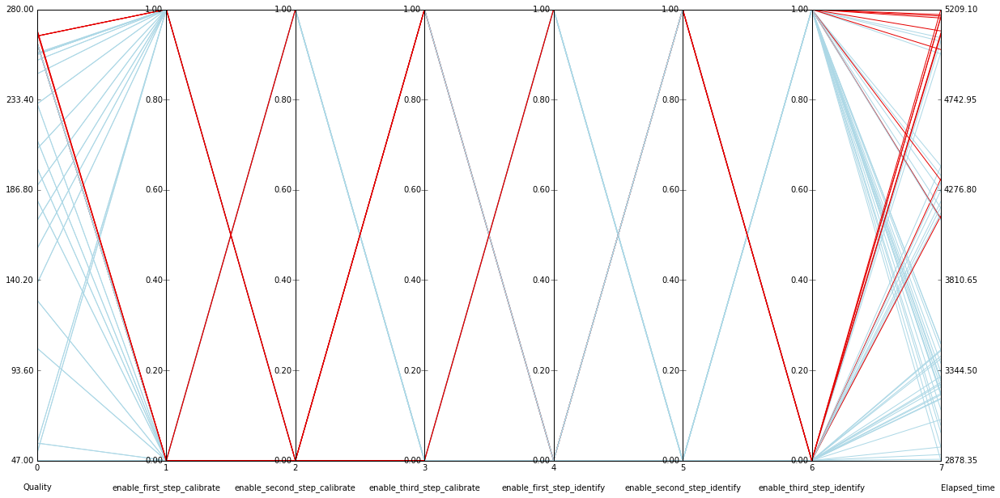

In [410]:
plot_64_colored.show()

### Top 14 out of the 64

In [413]:
indic_comp = [(i, *value) for i, value in enumerate(acumulated_indic)]
indic_comp[0:20]

[(0, 47.0),
 (1, 47.0),
 (2, 262.75),
 (3, 262.75),
 (4, 56.0),
 (5, 56.0),
 (6, 262.25),
 (7, 262.25),
 (8, 129.75),
 (9, 129.75),
 (10, 262.75),
 (11, 262.75),
 (12, 181.5),
 (13, 181.5),
 (14, 268.25),
 (15, 268.25),
 (16, 105.0),
 (17, 105.0),
 (18, 262.75),
 (19, 262.75)]

In [414]:
# (Index, score)
indic_comp.sort(key=lambda x: x[1])
top_14 = indic_comp[50:]
top_14

[(18, 262.75),
 (19, 262.75),
 (26, 262.75),
 (27, 262.75),
 (46, 266.25),
 (47, 266.25),
 (62, 266.25),
 (63, 266.25),
 (14, 268.25),
 (15, 268.25),
 (30, 269.25),
 (31, 269.25),
 (38, 280.0),
 (39, 280.0)]

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [425]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_14_64.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('14 best results out of the 64\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(14,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(14,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  88.0
Achieved by:  ['par0018', 'par0019', 'par0030', 'par0031']
Best quality indicator is:  292.25
Achieved by:  ['par0038', 'par0039']


In [426]:
acumulated_indic

array([[ 284.75],
       [ 284.75],
       [ 285.75],
       [ 285.75],
       [ 283.75],
       [ 283.75],
       [ 285.75],
       [ 285.75],
       [ 292.25],
       [ 292.25],
       [ 283.75],
       [ 283.75],
       [ 280.25],
       [ 280.25]])

In [427]:
index = [ind[0] for ind in top_14]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_14_new = list(zip(index, vals))
top_14_new

[(14, 284.75),
 (15, 284.75),
 (18, 285.75),
 (19, 285.75),
 (26, 283.75),
 (27, 283.75),
 (30, 285.75),
 (31, 285.75),
 (38, 292.25),
 (39, 292.25),
 (46, 283.75),
 (47, 283.75),
 (62, 280.25),
 (63, 280.25)]

In [428]:
top_14_new.sort(key=lambda x: x[1])
print(top_14_new)
top_6 = top_14_new[8:]
top_6

[(62, 280.25), (63, 280.25), (26, 283.75), (27, 283.75), (46, 283.75), (47, 283.75), (14, 284.75), (15, 284.75), (18, 285.75), (19, 285.75), (30, 285.75), (31, 285.75), (38, 292.25), (39, 292.25)]


[(18, 285.75),
 (19, 285.75),
 (30, 285.75),
 (31, 285.75),
 (38, 292.25),
 (39, 292.25)]

### Top 6 out of the 14

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [439]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_6_14.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('6 best results out of the 14\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(6,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(6,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  89.0
Achieved by:  ['par0030', 'par0031']
Best quality indicator is:  292.25
Achieved by:  ['par0038', 'par0039']


In [440]:
acumulated_indic

array([[ 286.25],
       [ 286.25],
       [ 286.75],
       [ 286.75],
       [ 292.25],
       [ 292.25]])

In [441]:
index = [ind[0] for ind in top_6]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_6_new = list(zip(index, vals))
top_6_new

[(18, 286.25),
 (19, 286.25),
 (30, 286.75),
 (31, 286.75),
 (38, 292.25),
 (39, 292.25)]

In [442]:
top_6_new.sort(key=lambda x: x[1])
print(top_6_new)

[(18, 286.25), (19, 286.25), (30, 286.75), (31, 286.75), (38, 292.25), (39, 292.25)]


## Fourth launch

Link to commit corresponding to this launch:
https://github.com/vinci1it2000/co2mpas/commit/725a899c9a2bcf79177c7cee5b4adb6c15f8962e

### For the 64 files

When we run the previous code from Victor, a `txt` with the total scores is produced. Here we retrieve this values **as a tuple of strings**:

In [685]:
import re
pattern = re.compile("Final quality indicator of the run is: (\d{2,5})(\.)*(\d{0,2})")
results = []

for i, line in enumerate(open('../Real_cars_output_post/Analysis_results_all.txt')):
    for match in re.finditer(pattern, line):
        #print('Found on line %s: %s' % (i+1, match.groups()))
        results.append(match.groups())

In [688]:
inputs = pd.read_excel('../Parameter_combination_June.xlsx','Tuning')
inputs

,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify
0,False,False,False,False,False,False
1,False,False,False,False,False,True
2,False,False,False,False,True,False
3,False,False,False,False,True,True
4,False,False,False,True,False,False
5,False,False,False,True,False,True
6,False,False,False,True,True,False
7,False,False,False,True,True,True
8,False,False,True,False,False,False
9,False,False,True,False,False,True


Convert scores to floats and sort them:

In [689]:
results_float = []
for val in results:
    results_float.append(float(val[0]) + float(val[2]) * 10**(-len(val[2])))     
all_64 = list(zip([i for i in range(64)], results_float))
all_64.sort(reverse=True, key=lambda x: x[1])
all_64[0:20]

[(27, 253.5),
 (10, 252.25),
 (26, 248.75),
 (58, 247.5),
 (59, 247.5),
 (39, 244.25),
 (15, 243.75),
 (23, 243.75),
 (47, 243.75),
 (55, 243.75),
 (31, 242.75),
 (7, 241.75),
 (63, 241.75),
 (35, 237.75),
 (42, 237.0),
 (50, 233.25),
 (51, 231.75),
 (3, 228.75),
 (11, 228.75),
 (19, 228.75)]

Pick how many of the first ones will be highlighted in the plot in red:
```
#E50000 => RED
#ADD8E6 => LIGHT BLUE
```

In [690]:
best_0_14_idx = [val[0] for val in all_64[0:14]]
colors_simple = ['#ADD8E6' if not(i in best_0_14_idx) else '#E50000' for i in range(64)]

Get some statistics from every batch:
```
· run time
· mean(error)
· mean(abs(error))
· stdev(error)
· max(error)
· min(error)
· avg(num perturbations)
```

In [691]:
os.chdir(workdir)
elapsed = []
meanError = []
meanAbsError = []
stdError = []
minim = []
maxim = []
meanPer = []
for file in glob.glob("*summary.xlsx"):
    # Second sheet of the Excel
    proc_info = pd.read_excel(file, 'proc_info')
    elapsed.append(float(proc_info['Value'][2].split()[0]))
    # First sheet of the Excel
    summary = pd.read_excel(file, 'summary', header=[0, 1, 2, 3], index_col=[0], skiprows=[4])
    out = np.array(summary.loc[:, idx['nedc_h', 'prediction', 'output', 'value']])[:-1]
    tar = np.array(summary['nedc_h', 'prediction', 'target'][['value', 'declared_value']].max(axis=1))[:-1]
    per = np.array(summary.loc[:, idx['wltp_h', 'calibration', 'output', 'rescaling_n']])[:-1]
    error = (out - tar) / tar
    meanError.append(np.mean(error))
    meanAbsError.append(np.mean(np.abs(error)))
    stdError.append(np.std(error, ddof=1)) #<-- Check np.std docs for the meaning of ddof
    minim.append(np.min(error))
    maxim.append(np.max(error))
    meanPer.append(np.mean(per))

addInfo = pd.DataFrame(data = list(map(list, zip(*[elapsed, meanError, meanAbsError, stdError, minim, maxim, meanPer]))), 
                       columns=['Elapsed_time', 'mean(error)', 'mean(abs(error))', 'std(error)', 'min(error)','max(error)', 'mean(perturbations)'])

D:\Apps\co2mpas_AIO-v1.5.5\Apps\WinPython\python-3.5.2.amd64\lib\site-packages\ipykernel\kernelbase.py:390: PerformanceWarning: indexing past lexsort depth may impact performance.
  user_expressions, allow_stdin)


**Combine** scores, inputs and statistics:

In [703]:
outputs = pd.DataFrame(data=results_float, columns=['Quality_indicator'])
combined = outputs.join(inputs).join(addInfo)

In [704]:
combined_sorted = pd.DataFrame(data=combined.sort_values('Quality_indicator', ascending=True))
colors_sorted = [colors_simple[combined_sorted.index[i]] for i in range(64)]

In [694]:
[(combined_sorted.index[i], colors_sorted[i]) for i in range(64)]

[(0, '#ADD8E6'),
 (32, '#ADD8E6'),
 (4, '#ADD8E6'),
 (36, '#ADD8E6'),
 (16, '#ADD8E6'),
 (2, '#ADD8E6'),
 (18, '#ADD8E6'),
 (8, '#ADD8E6'),
 (40, '#ADD8E6'),
 (48, '#ADD8E6'),
 (44, '#ADD8E6'),
 (12, '#ADD8E6'),
 (56, '#ADD8E6'),
 (28, '#ADD8E6'),
 (60, '#ADD8E6'),
 (24, '#ADD8E6'),
 (52, '#ADD8E6'),
 (20, '#ADD8E6'),
 (14, '#ADD8E6'),
 (62, '#ADD8E6'),
 (30, '#ADD8E6'),
 (41, '#ADD8E6'),
 (49, '#ADD8E6'),
 (33, '#ADD8E6'),
 (25, '#ADD8E6'),
 (1, '#ADD8E6'),
 (17, '#ADD8E6'),
 (57, '#ADD8E6'),
 (9, '#ADD8E6'),
 (54, '#ADD8E6'),
 (6, '#ADD8E6'),
 (22, '#ADD8E6'),
 (38, '#ADD8E6'),
 (21, '#ADD8E6'),
 (45, '#ADD8E6'),
 (5, '#ADD8E6'),
 (61, '#ADD8E6'),
 (37, '#ADD8E6'),
 (13, '#ADD8E6'),
 (29, '#ADD8E6'),
 (53, '#ADD8E6'),
 (34, '#ADD8E6'),
 (46, '#ADD8E6'),
 (11, '#ADD8E6'),
 (43, '#ADD8E6'),
 (3, '#ADD8E6'),
 (19, '#ADD8E6'),
 (51, '#ADD8E6'),
 (50, '#ADD8E6'),
 (42, '#ADD8E6'),
 (35, '#E50000'),
 (63, '#E50000'),
 (7, '#E50000'),
 (31, '#E50000'),
 (55, '#E50000'),
 (23, '#E50000'),
 (

In [696]:
combined_sorted

,Quality_indicator,enable_first_step_calibrate,enable_second_step_calibrate,enable_third_step_calibrate,enable_first_step_identify,enable_second_step_identify,enable_third_step_identify,Elapsed_time,mean(error),mean(abs(error)),std(error),min(error),max(error),mean(perturbations)
0,47.00,False,False,False,False,False,False,2964.487,0.252743,0.313001,1.530289,-0.146980,10.262608,0.000000
32,50.00,True,False,False,False,False,False,3042.636,0.068686,0.079834,0.081710,-0.051508,0.317791,0.000000
4,56.00,False,False,False,True,False,False,3238.140,0.069521,0.079466,0.081311,-0.043607,0.314348,5.511111
36,56.00,True,False,False,True,False,False,3312.508,0.069519,0.079463,0.081309,-0.043604,0.314330,5.511111
16,86.50,False,True,False,False,False,False,2908.546,0.152895,0.213764,1.182507,-0.122565,7.903699,0.000000
2,127.00,False,False,False,False,True,False,3034.908,0.144581,0.211808,1.183440,-0.126670,7.903699,6.044444
18,127.00,False,True,False,False,True,False,3021.411,0.144579,0.211809,1.183440,-0.126670,7.903699,6.044444
8,128.50,False,False,True,False,False,False,3243.244,0.006904,0.025442,0.030779,-0.049839,0.079823,0.000000
40,131.00,True,False,True,False,False,False,3223.853,0.006217,0.024498,0.029316,-0.044040,0.071396,0.000000
48,148.50,True,True,False,False,False,False,3095.930,0.004408,0.024651,0.029729,-0.045370,0.074972,0.000000


In [705]:
labels = ['Quality'] + [lab for lab in inputs.columns] + [lab for lab in elapsed_df.columns]
plot_64_colored = parallel_coordinates(combined_sorted.as_matrix(), tags=labels, style=colors_sorted, dots=0)

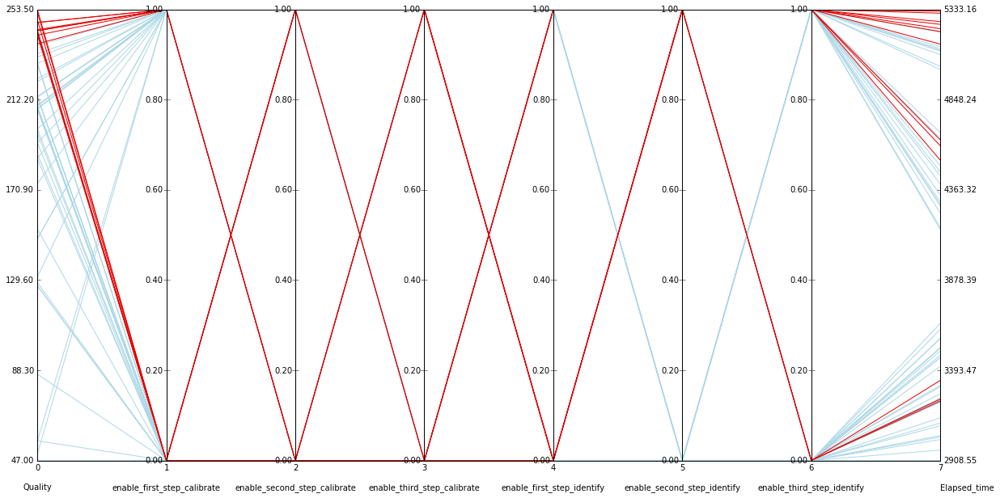

In [706]:
plot_64_colored.show()

### Top 14 out of the 64

In [481]:
indic_comp = [(i, *value) for i, value in enumerate(acumulated_indic)]
indic_comp[0:20]

[(0, 47.0),
 (1, 208.0),
 (2, 127.0),
 (3, 228.75),
 (4, 56.0),
 (5, 213.5),
 (6, 209.25),
 (7, 241.75),
 (8, 128.5),
 (9, 208.0),
 (10, 252.25),
 (11, 228.75),
 (12, 153.0),
 (13, 213.5),
 (14, 196.75),
 (15, 243.75),
 (16, 86.5),
 (17, 208.0),
 (18, 127.0),
 (19, 228.75)]

In [482]:
# (Index, score)
indic_comp.sort(key=lambda x: x[1])
top_14 = indic_comp[50:]
top_14

[(35, 237.75),
 (7, 241.75),
 (63, 241.75),
 (31, 242.75),
 (15, 243.75),
 (23, 243.75),
 (47, 243.75),
 (55, 243.75),
 (39, 244.25),
 (58, 247.5),
 (59, 247.5),
 (26, 248.75),
 (10, 252.25),
 (27, 253.5)]

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [493]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_14_64.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('14 best results out of the 64\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(14,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(14,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  68.5
Achieved by:  ['par0027']
Best quality indicator is:  259.75
Achieved by:  ['par0015', 'par0023', 'par0047']


In [494]:
acumulated_indic

array([[ 257.25],
       [ 253.5 ],
       [ 259.75],
       [ 259.75],
       [ 259.25],
       [ 258.  ],
       [ 258.75],
       [ 252.75],
       [ 254.75],
       [ 259.75],
       [ 251.25],
       [ 256.75],
       [ 252.  ],
       [ 252.25]])

In [495]:
index = [ind[0] for ind in top_14]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_14_new = list(zip(index, vals))
top_14_new

[(7, 257.25),
 (10, 253.5),
 (15, 259.75),
 (23, 259.75),
 (26, 259.25),
 (27, 258.0),
 (31, 258.75),
 (35, 252.75),
 (39, 254.75),
 (47, 259.75),
 (55, 251.25),
 (58, 256.75),
 (59, 252.0),
 (63, 252.25)]

In [496]:
top_14_new.sort(key=lambda x: x[1])
print(top_14_new)
top_6 = top_14_new[8:]
top_6

[(55, 251.25), (59, 252.0), (63, 252.25), (35, 252.75), (10, 253.5), (39, 254.75), (58, 256.75), (7, 257.25), (27, 258.0), (31, 258.75), (26, 259.25), (15, 259.75), (23, 259.75), (47, 259.75)]


[(27, 258.0),
 (31, 258.75),
 (26, 259.25),
 (15, 259.75),
 (23, 259.75),
 (47, 259.75)]

### Top 6 out of the 14

Before running this part, you need to re-run the previous part forming the dataframes and calculations for this new folder

In [507]:
#Calculate final score of the run for all vehicles, mock ups, and Final quality indicator of the run
output = open("Analysis_results_6_14.txt", "w")
output.write('RESULTS OF THE PARAMETER-TUNING ANALYSIS:\n')
output.write('6 best results out of the 14\n\n')
max_score = 0
best_score = []
acumulated_score = np.ndarray(shape=(6,1))
max_indic = 0
best_indic = []
acumulated_indic = np.ndarray(shape=(6,1))

for index, file in enumerate(glob.glob("*summary.xlsx")):
    ALL_SCORE = (ind_normDF.loc['Averages'].loc[file].sum() + 
                      ind_normDF.loc['StdDev'].loc[file].sum() + 
                      ind_normDF.loc['Success'].loc[file].sum() +
                      ind_normDF.loc['Maximum'].loc[file].sum() + 
                      ind_normDF.loc['Minimum'].loc[file].sum() + 
                      ind_normDF.loc['Range'].loc[file].sum())
    MOCK_UPS_SCORE = (m_ind_normDF.loc['Averages'].loc[file].sum() + 
                      m_ind_normDF.loc['StdDev'].loc[file].sum() + 
                      m_ind_normDF.loc['Success'].loc[file].sum() +
                      m_ind_normDF.loc['Maximum'].loc[file].sum() + 
                      m_ind_normDF.loc['Minimum'].loc[file].sum() + 
                      m_ind_normDF.loc['Range'].loc[file].sum())
    #calculate the number of success cases in NEDC-H and NEDC-L for all vehicles on each run
    NEDC_successes = ind_statsDF['NEDC-H [%]'].loc['Success'][file] + ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    #calculate the number of success cases in NEDC-H and NEDC-L for mock up vehicles on each run
    NEDC_m_successes = m_ind_statsDF['NEDC-H [%]'].loc['Success'][file] + m_ind_statsDF['NEDC-L [%]'].loc['Success'][file]
    output.write(file + ' \nScore for all vehicles is ' + str(ALL_SCORE) + '; mock up score is ' + str(MOCK_UPS_SCORE) + '; and TOTAL score is ' + str(ALL_SCORE + MOCK_UPS_SCORE) + '\n')
    FINAL_QUALITY_INDICATOR = 2*(NEDC_successes + NEDC_m_successes) + ALL_SCORE + MOCK_UPS_SCORE + 1.5* MOCK_UPS_SCORE
    output.write('Final quality indicator of the run is: ' + str(FINAL_QUALITY_INDICATOR) + '\n\n')
    if (ALL_SCORE + MOCK_UPS_SCORE) > max_score:
        best_score = [file[0:7]]
        max_score = ALL_SCORE + MOCK_UPS_SCORE
    elif (ALL_SCORE + MOCK_UPS_SCORE) == max_score:
        best_score += [file[0:7]]
    acumulated_score[index] = ALL_SCORE + MOCK_UPS_SCORE
    if FINAL_QUALITY_INDICATOR > max_indic:
        best_indic = [file[0:7]]
        max_indic = FINAL_QUALITY_INDICATOR
    elif FINAL_QUALITY_INDICATOR == max_indic:
        best_indic += [file[0:7]]
    acumulated_indic[index] = FINAL_QUALITY_INDICATOR

print('Best total score is: ', max_score)
print('Achieved by: ' , best_score)
print('Best quality indicator is: ', max_indic)
print('Achieved by: ' , best_indic)

output.write('\n\n' + 'Best total score is: ' + str(max_score) + '\n')
output.write('Achieved by: ' + str(best_score))
output.write('\n\n' + 'Best quality indicator is: ' + str(max_indic) + '\n')
output.write('Achieved by: ' + str(best_indic) + '\n' + '\n')

output.close()

Best total score is:  77.5
Achieved by:  ['par0027']
Best quality indicator is:  276.25
Achieved by:  ['par0026']


In [508]:
acumulated_indic

array([[ 268.5 ],
       [ 271.  ],
       [ 276.25],
       [ 270.75],
       [ 267.5 ],
       [ 271.  ]])

In [509]:
index = [ind[0] for ind in top_6]
index.sort()
vals = [value[0] for value in acumulated_indic.tolist()]
top_6_new = list(zip(index, vals))
top_6_new

[(15, 268.5),
 (23, 271.0),
 (26, 276.25),
 (27, 270.75),
 (31, 267.5),
 (47, 271.0)]

In [510]:
top_6_new.sort(key=lambda x: x[1])
print(top_6_new)

[(31, 267.5), (15, 268.5), (27, 270.75), (23, 271.0), (47, 271.0), (26, 276.25)]


## Fifth launch

Link to commit corresponding to this launch:
https://github.com/vinci1it2000/co2mpas/commit/4c077512de9127f377b3802d2c82fe8ebd56f5c2

# Next